# Машинное обучение, ФКН ВШЭ

## Практическое задание 2. Exploratory Data Analysis и линейная регрессия

### Общая информация
Дата выдачи: 05.10.2023

Мягкий дедлайн: 23:59MSK 18.10.2023

Жесткий дедлайн: 23:59MSK 22.10.2022

### О задании
В этом задании мы попытаемся научиться анализировать данные и выделять из них полезные признаки. Мы также научимся пользоваться `seaborn` и `sklearn`, а заодно привыкнем к основным понятиям машинного обучения.

### Оценивание и штрафы
Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов. Проверяющий имеет право снизить оценку за неэффективную реализацию или неопрятные графики.

**Обратите внимание**, что в каждом разделе домашнего задания есть оцениваниемые задачи и есть вопросы. Вопросы дополняют задачи и направлены на то, чтобы проинтерпретировать или обосновать происходящее. Код без интерпретации не имеет смысла, поэтому отвечать на вопросы обязательно — за отсутствие ответов мы будем снижать баллы за задачи. Если вы ответите на вопросы, но не напишете корректный код к соответствующим оцениваемым задачам, то баллы за такое выставлены не будут.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

### Формат сдачи
Задания сдаются через систему Anytask. Инвайт можно найти на странице курса. Присылать необходимо ноутбук с выполненным заданием. Сам ноутбук называйте в формате homework-practice-02-linregr-Username.ipynb, где Username — ваша фамилия.

Для удобства проверки самостоятельно посчитайте свою максимальную оценку (исходя из набора решенных задач) и укажите ниже.

Оценка: xx.

В этом ноутбуке используется библиотека `folium` для визуализации карт. Она работает в google colab!

In [1]:
!pip install folium

In [2]:
import folium

m = folium.Map(location=(55.7522200, 37.6155600), zoom_start=10)

m

Если вы всё сделали правильно, то выше должна открыться карта Москвы.

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

sns.set(style="darkgrid")

np.random.seed(0)

## Часть 0. Подготовка (1 балл)

**Задание 1 (1 балл)**. Мы будем работать с данными из соревнования [New York City Taxi Trip Duration](https://www.kaggle.com/c/nyc-taxi-trip-duration/overview), в котором нужно было предсказать длительность поездки на такси. Скачайте обучающую выборку из этого соревнования и загрузите ее:

In [4]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
data_train = pd.read_csv('train.csv')
data_train.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435


Обратите внимание на колонки `pickup_datetime` и `dropoff_datetime`. `dropoff_datetime` был добавлена организаторами только в обучающую выборку, то есть использовать эту колонку нельзя, давайте удалим ее. В `pickup_datetime` записаны дата и время начала поездки. Чтобы с ней было удобно работать, давайте преобразуем даты в `datetime`-объекты

In [5]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
data_train['pickup_datetime'] = pd.to_datetime(data_train['pickup_datetime'])
data_train = data_train.drop('dropoff_datetime', axis=1)
data_train.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,N,435


В колонке `trip_duration` записано целевое значение, которое мы хотим предсказывать. Давайте посмотрим на распределение таргета в обучающей выборке. Для этого нарисуйте его гистограмму:

In [6]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
import matplotlib.pyplot as plt
import seaborn as sns
%config InlineBackend.figure_format = 'retina'
plt.rcParams['figure.figsize'] = 10, 5
plt.rcParams['font.size'] = 12
sns.set_style('darkgrid')

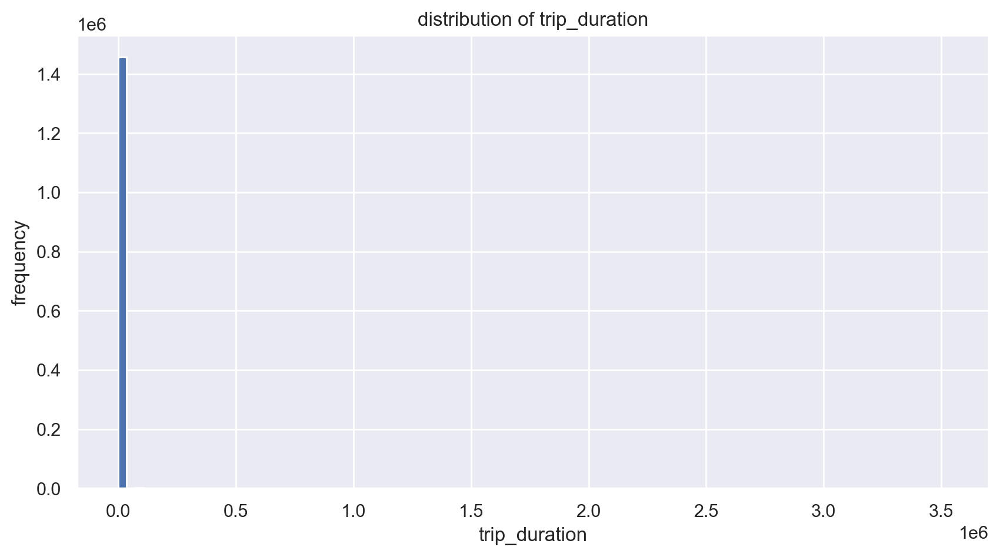

In [7]:
f,ax = plt.subplots()
ax.set_title('distribution of trip_duration')
ax.set_ylabel('frequency')
ax.set_xlabel('trip_duration')
ax.hist(data_train['trip_duration'], bins=100)
plt.show()

Какая-то странность. Наверное, нужно нарисовать гистограмму в лог шкале. Пока вряд ли можно сказать что-то разумное, вероятно, это можно будет сделать по отлогарифмированной гистограмме.

**Вопрос**: Что можно сказать о целевой переменной по гистограмме её значений?

В соревновании в качестве метрики качества использовалось RMSLE:
$$\text{RMSLE}(X, y, a) = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \big(\log{(y_i + 1)} - \log{(a(x_i) + 1)}\big)^2}$$

**Вопрос**: Как вы думаете, почему авторы соревнования выбрали именно RMSLE, а не RMSE?

Ну во первых, такая матрика подходит только для данных с неотрицательной целевой переменной (а в нашем случае она именно такая). Также такая метрика штрафует скорее за ошибки в порядке величин, чем за отклонение в значениях, что тоже подходит в данной ситуации. Нам важно угадать порядок длины поездки, нежели точное значение. Также можно сказать, что эта функция потерь в силу несимметричности штрафует за заниженные прогнозы сильнее, чем за завышенные, что логично в данной ситуации: если мы немного переоценим длину поездки это будет не так страшно, чем если мы сделаем предсказание сильно заниженное.

На семинаре мы рассматривали несколько моделей линейной регрессии в `sklearn`, но каждая из них оптимизировала среднеквадратичную ошибку (MSE), а не RMSLE. Давайте проделаем следующий трюк: будем предсказывать не целевую переменную, а ее *логарифм*. Обозначим $\hat{y}_i = \log{(y_i + 1)}$ — модифицированный таргет, а $\hat{a}(x_i)$ — предсказание модели, которая обучалась на $\hat{y}_i$, то есть логарифм таргета. Чтобы предсказать исходное значение, мы можем просто взять экспоненту от нашего предсказания: $a(x_i) = \exp(\hat{a}(x_i)) - 1$.

**Вопрос**: Покажите, что оптимизация RMSLE для модели $a$ эквивалентна оптимизации MSE для модели $\hat{a}$.

**Доказательство**: $$\text{RMSLE}(X, y, a) = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \big(\log{(y_i + 1)} - \log{(a(x_i) + 1)}\big)^2} = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \big(\hat{y}_i - \hat{a}(x_i)\big)^2} = \text{MSE}(\hat{a}, \hat{y})$$

То есть по сути мы перешли к новым значениям предсказания и таргета, и в новых значениях наша RMSLE со старыми значениями эквивалентна MSE в новых значениях

Итак, мы смогли свести задачу оптимизации RMSLE к задаче оптимизации MSE, которую мы умеем решать! Кроме того, у логарифмирования таргета есть еще одно полезное свойство. Чтобы его увидеть, добавьте к нашей выборке колонку `log_trip_duration` (воспользуйтесь `np.log1p`) и нарисуйте гистограмму модифицированного таргета по обучающей выборке. Удалите колонку со старым таргетом.

In [8]:
data_train['log_trip_duration'] = np.log1p(data_train['trip_duration'])
data_train = data_train.drop(['trip_duration'], axis=1)
data_train.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration
0,id2875421,2,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,N,6.122493
1,id2377394,1,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,N,6.498282
2,id3858529,2,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,N,7.661527
3,id3504673,2,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,N,6.063785
4,id2181028,2,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,N,6.077642


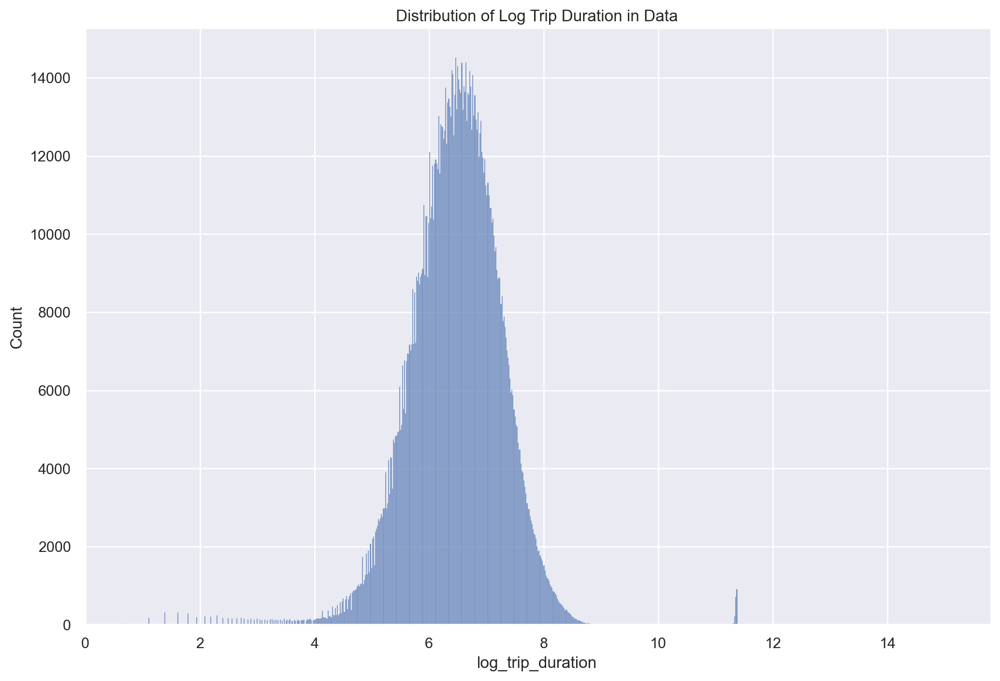

In [9]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
sns.displot(data_train['log_trip_duration'], height=7, aspect=1.5)
plt.title('Distribution of Log Trip Duration in Data')
plt.show()

Можно сказать, что таргет распределен нормально. Также можно увидеть, что присутствуют выбросы.

Чтобы иметь некоторую точку отсчета, давайте посчитаем значение метрики при наилучшем константном предсказании:

In [10]:
def rmsle(log1p_y_true, log1p_y_pred): 
    #╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
    squares = (log1p_y_true - log1p_y_pred) ** 2
    return np.sqrt(np.mean(squares))

rmsle_best_const = rmsle(data_train['log_trip_duration'], np.mean(data_train['log_trip_duration']))
print(rmsle_best_const)
assert np.allclose(rmsle_best_const, 0.79575, 1e-4)

0.7957592365412156


## Часть 1. Изучаем `pickup_datetime` (2 балла)

**Задание 2 (0.25 баллов)**. Для начала давайте посмотрим, сколько всего было поездок в каждый из дней. Постройте график зависимости количества поездок от дня в году (например, можно воспользоваться `sns.countplot`):

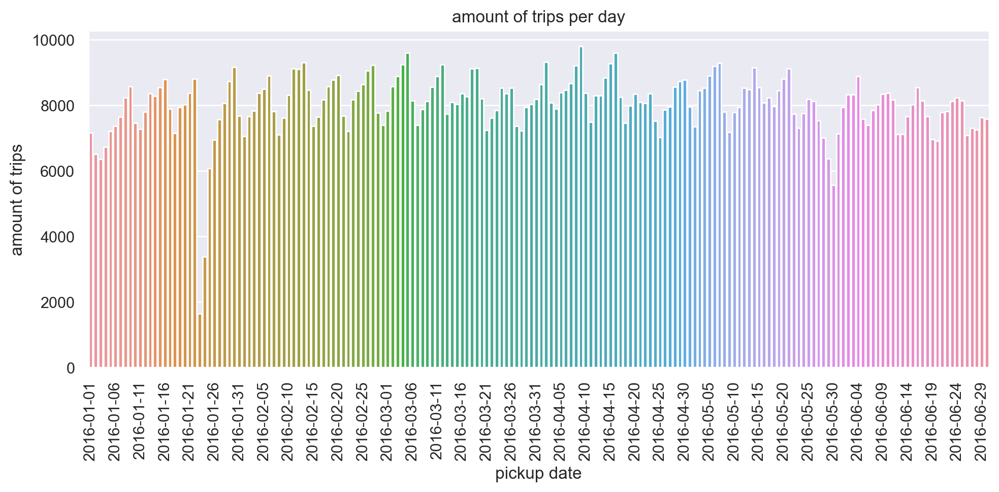

In [11]:
data_train['pickup_date'] = data_train['pickup_datetime'].dt.date
data_train = data_train.sort_values('pickup_date')

sns.countplot(x='pickup_date', data=data_train)

days = data_train['pickup_date'].unique()[::5]

plt.xticks(ticks=np.arange(0, len(data_train['pickup_date'].unique()), 5), labels=days, rotation=90)

plt.xlabel('pickup date')
plt.ylabel('amount of trips')
plt.title('amount of trips per day')
plt.tight_layout()
plt.show()

**Вопрос**: Вы, вероятно, заметили, что на графике есть 2 периода с аномально маленькими количествами поездок. Вычислите, в какие даты происходили эти скачки вниз и найдите информацию о том, что происходило в эти дни в Нью-Йорке.

Нарисуйте графики зависимости количества поездок от дня недели и от часов в сутках (воспользуйтесь `sns.relplot`):

1) Видим аномально мало поездок в январе 2016 года. Как подсказывает википедия, в это время в Нью-Йорке были сильнейшие снегопады (https://en.wikipedia.org/wiki/January_2016_United_States_blizzard)

2) Оттуда же узнаем, что 30 мая - это день поминовения. Этот день посвящён памяти американских военнослужащих, погибших во всех войнах и вооружённых конфликтах, в которых США когда-либо принимали участие.

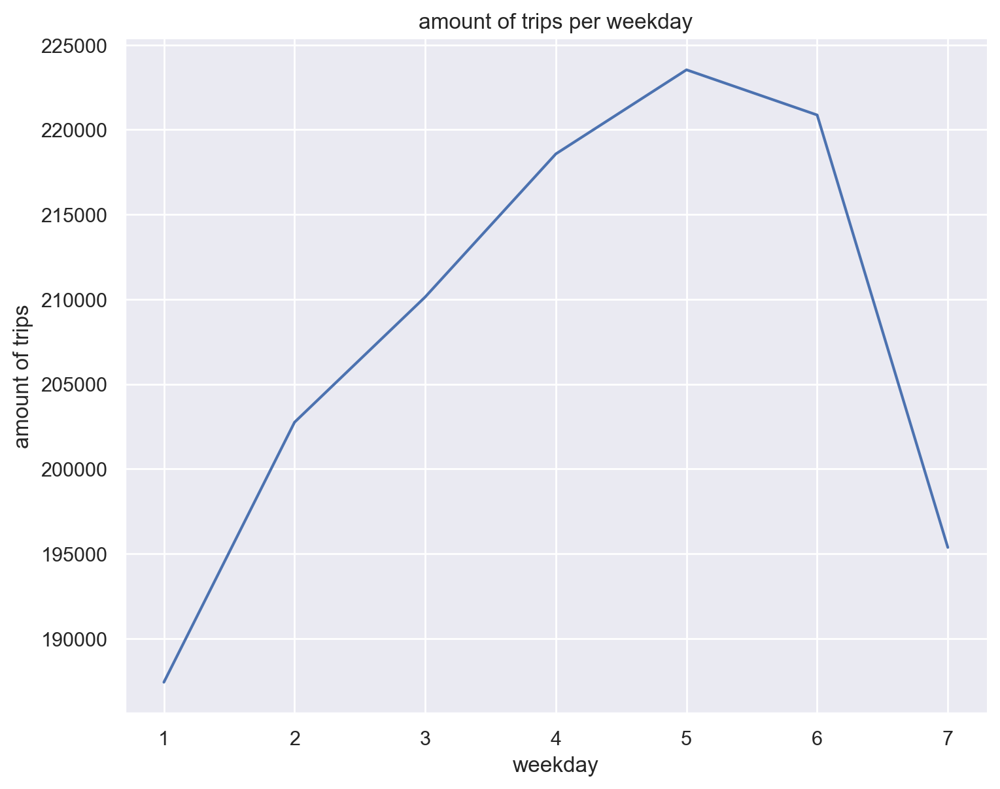

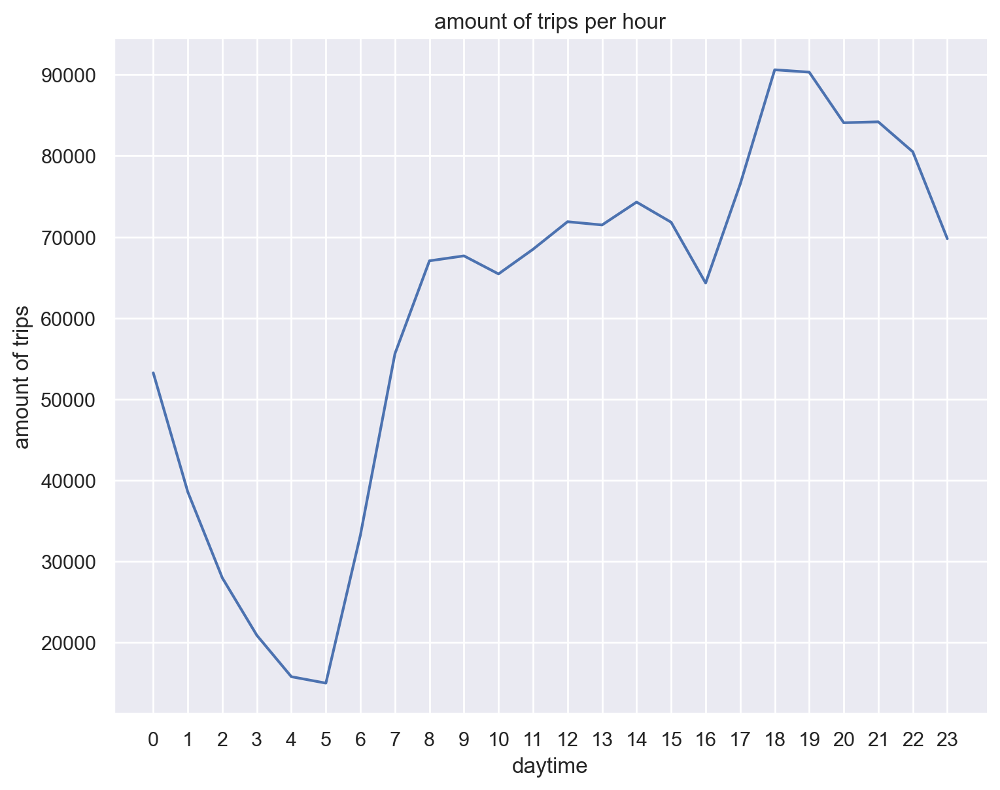

In [12]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
# Сначала нарисуем зависимость от дня недели
data_train['weekday'] = data_train['pickup_datetime'].dt.weekday
data_train['weekday'] += 1
weekday_trips = data_train.groupby('weekday')['id'].count().reset_index()

sns.relplot(x='weekday', y='id', kind='line', data=weekday_trips, height=6, aspect=1.3)
plt.title('amount of trips per weekday')
plt.ylabel('amount of trips')

plt.show()


data_train['daytime'] = data_train['pickup_datetime'].dt.hour
weekday_trips = data_train.groupby('daytime')['id'].count().reset_index()

sns.relplot(x='daytime', y='id', kind='line', data=weekday_trips, height=6, aspect=1.3)
plt.xticks(ticks=np.arange(0, 24))
plt.ylabel('amount of trips')
plt.title('amount of trips per hour')
plt.show()

**Задание 3 (0.5 баллов)**. Нарисуйте на одном графике зависимости количества поездок от часа в сутках для разных месяцев (разные кривые, соответствующие разным месяцам, окрашивайте в разные цвета, воспользуйтесь `hue` в `sns.relplot`). Аналогично нарисуйте зависимости количества поездок от часа в сутках для разных дней недели.

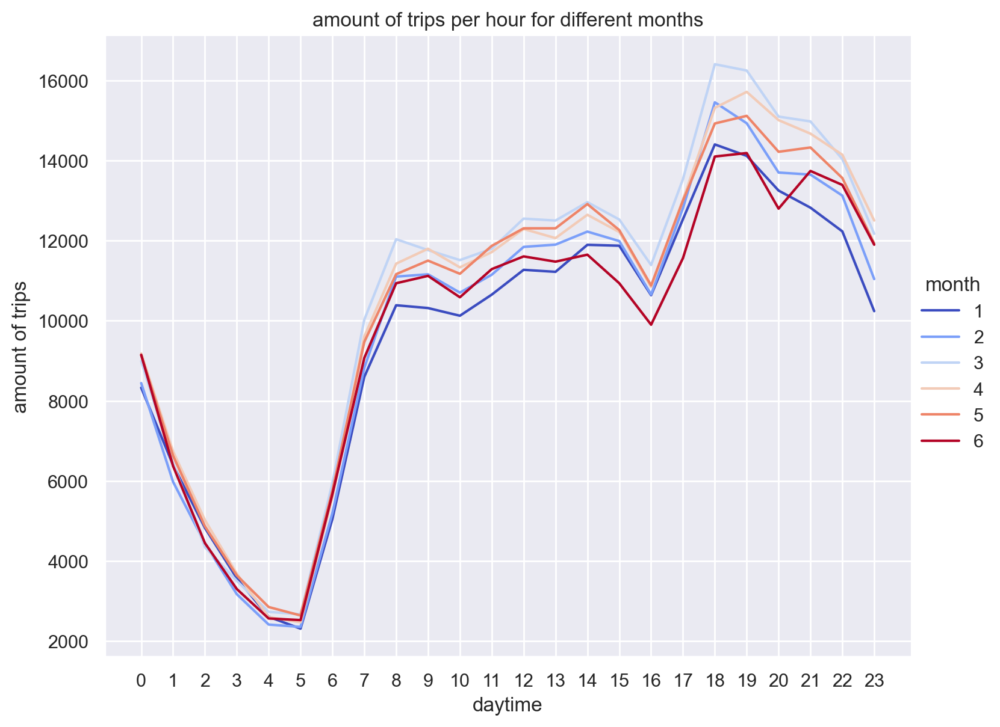

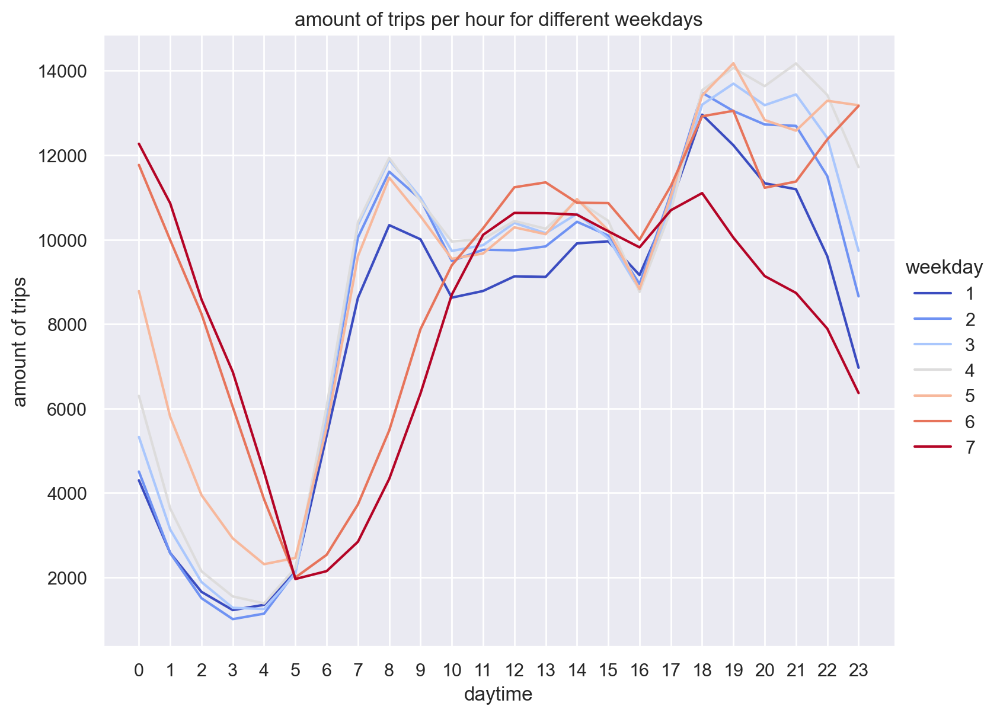

In [13]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
data_train['month'] = data_train['pickup_datetime'].dt.month
hour_month_trips = data_train.groupby(['daytime', 'month'])['id'].count().reset_index()
sns.relplot(x='daytime', y='id', kind='line', hue='month', data=hour_month_trips,  height=6, aspect=1.3, palette="coolwarm")
plt.xticks(ticks=np.arange(0, 24))
plt.title('amount of trips per hour for different months')
plt.ylabel('amount of trips')


hour_weekday_trips = data_train.groupby(['daytime', 'weekday'])['id'].count().reset_index()
sns.relplot(x='daytime', y='id', kind='line', hue='weekday', data=hour_weekday_trips, height=6, aspect=1.3, palette="coolwarm")
plt.xticks(ticks=np.arange(0, 24))
plt.title('amount of trips per hour for different weekdays')
plt.ylabel('amount of trips')

plt.show()

In [14]:
data_train

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration,pickup_date,weekday,daytime,month
333752,id0752048,1,2016-01-01 01:11:29,1,-73.963486,40.768528,-73.969521,40.757580,N,5.616771,2016-01-01,5,1,1
616306,id3056049,1,2016-01-01 13:05:31,1,-73.998032,40.751167,-73.976761,40.751854,N,6.122493,2016-01-01,5,13,1
1391034,id2365766,1,2016-01-01 15:25:38,1,-74.005302,40.728542,-73.978622,40.764221,N,6.976348,2016-01-01,5,15,1
1138825,id3938094,2,2016-01-01 08:37:27,1,-73.977592,40.632847,-73.977592,40.632847,N,6.025866,2016-01-01,5,8,1
537651,id2777099,2,2016-01-01 12:44:13,2,-73.956978,40.770802,-73.979050,40.785332,N,6.293419,2016-01-01,5,12,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1061088,id0989838,1,2016-06-30 21:10:48,1,-73.988762,40.745022,-73.998344,40.751926,N,5.968708,2016-06-30,4,21,6
1061098,id0776372,1,2016-06-30 18:30:53,1,-73.972488,40.759258,-73.991508,40.697147,N,8.032035,2016-06-30,4,18,6
1253084,id3033214,1,2016-06-30 15:42:12,3,-73.979324,40.766941,-73.971939,40.782211,N,5.872118,2016-06-30,4,15,6
1268014,id0845635,2,2016-06-30 00:11:12,1,-74.007706,40.742920,-73.985443,40.768883,N,5.908083,2016-06-30,4,0,6


**Вопрос**: Какие выводы можно сделать, основываясь на графиках выше? Выделяются ли какие-нибудь дни недели? Месяца? Время суток? С чем это связано?

1) В пятницу количество поездок сильно возрастает. Возможно, это связано с концом рабочей недели. Люди устают и не хотят ехать на общественном транспорте.

2) Меньше всего поездок в понедельник. Вероятно, люди отдохнули за выходные и в начале рабочей недели не хотят тратить деньги на такси.

3) На втором месте после понедельника - воскресенье. Вероятно воскресенье люди предпочитают отдыхать дома и никуда не ездить.

4) Больше всего поездок в марте. Вероятно, в марте плохая погода, много дождей.

5) Наименьшее количество поездок в 4-5 утра. Люди спят в это время. В то время как с 00 до 4 идет резкое снижение количества поездок. Вероятно, после 12 ночи многие едут по домам после каких-либо мероприятий.

6) Ночью с понедельник на воскресенье меньше всего поездок. Вероятно, люди готовятся к рабочей неделе и не ездят никуда ночью.

7) Больше всего поездок с 18 до 19. Это окончание рабочего дня, люди едут с работы.



**Задание 4 (0.5 баллов)**. Разбейте выборку на обучающую и тестовую в отношении 7:3 (используйте `train_test_split` из `sklearn`). По обучающей выборке нарисуйте график зависимости среднего логарифма времени поездки от дня недели. Затем сделайте то же самое, но для часа в сутках и дня в году.

In [15]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
from sklearn.model_selection import train_test_split

df_train, df_test, y_test, y_train = train_test_split(data_train, data_train['log_trip_duration'], train_size=0.7, random_state=10)


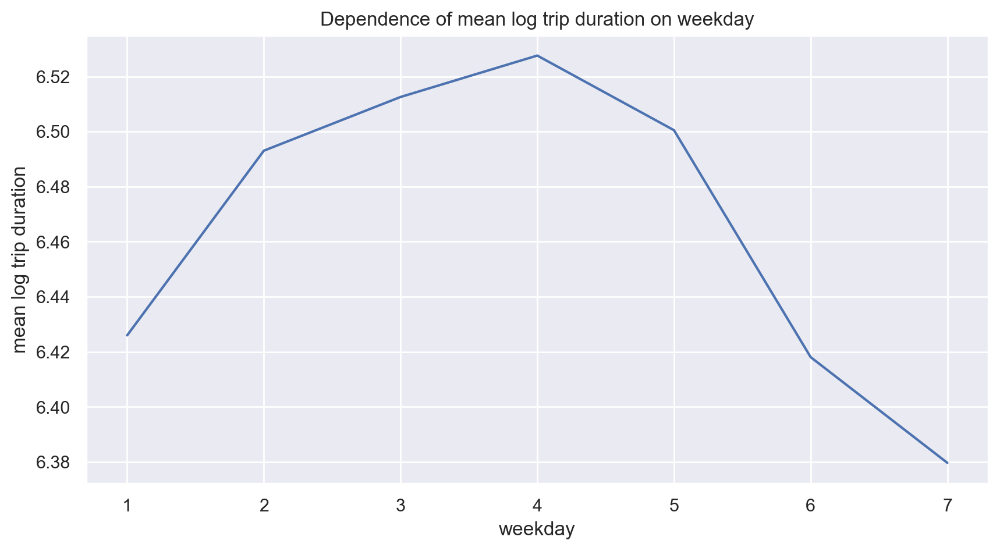

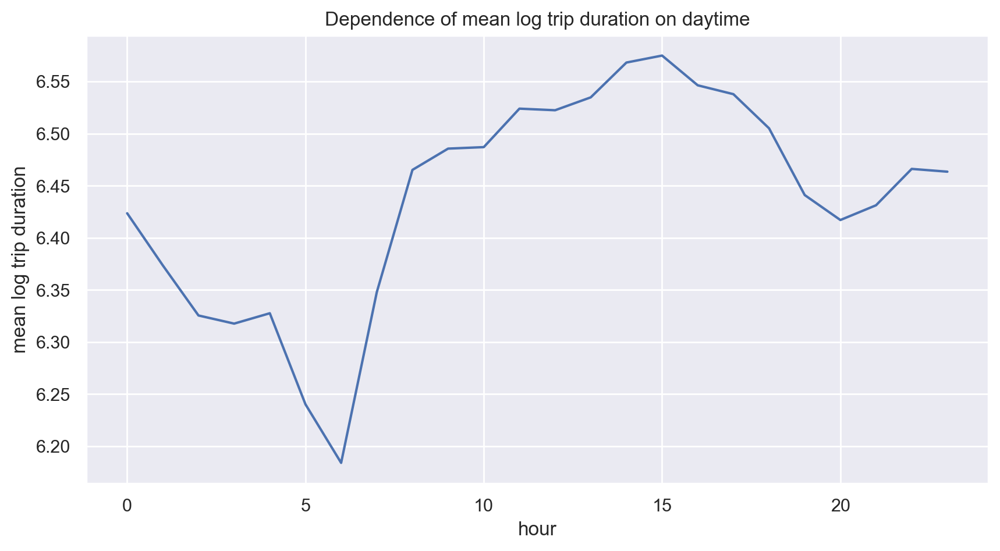

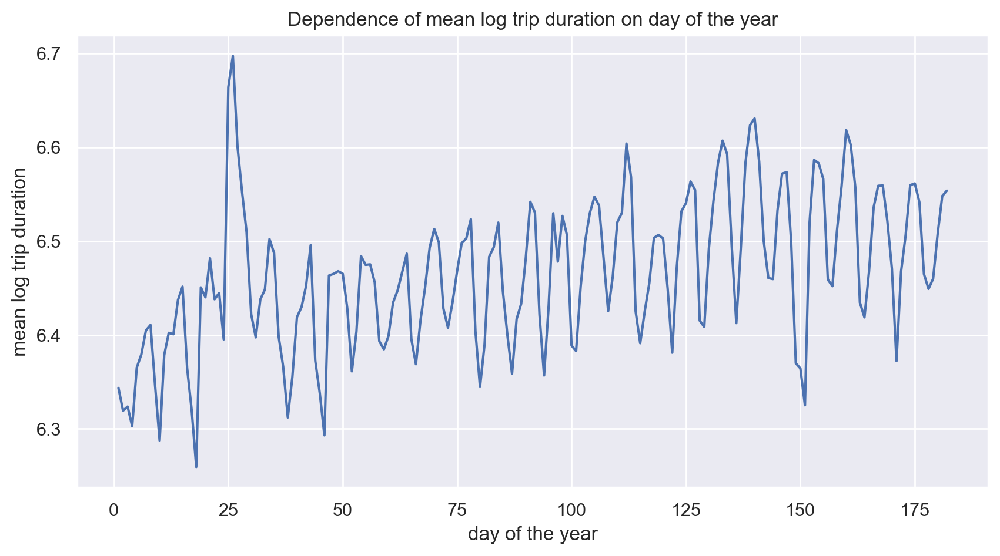

In [16]:
mean_logduration_weekday = df_train.groupby('weekday')['log_trip_duration'].mean().reset_index()
sns.lineplot(x='weekday', y='log_trip_duration', data=mean_logduration_weekday)
plt.title('Dependence of mean log trip duration on weekday')
plt.xlabel('weekday')
plt.ylabel('mean log trip duration')
plt.show()

mean_logduration_daytime = df_train.groupby('daytime')['log_trip_duration'].mean().reset_index()
sns.lineplot(x='daytime', y='log_trip_duration', data=mean_logduration_daytime)
plt.title('Dependence of mean log trip duration on daytime')
plt.xlabel('hour')
plt.ylabel('mean log trip duration')
plt.show()

df_train['dayofyear'] = data_train['pickup_datetime'].dt.dayofyear

mean_logduration_dayofyear = df_train.groupby('dayofyear')['log_trip_duration'].mean().reset_index()
sns.lineplot(x='dayofyear', y='log_trip_duration', data=mean_logduration_dayofyear)
plt.title('Dependence of mean log trip duration on day of the year')
plt.xlabel('day of the year')
plt.ylabel('mean log trip duration')
plt.show()

**Вопрос**: Похожи ли графики зависимости таргета от дня недели и от часа в сутках на аналогичные графики для количества поездок? Почему? Что происходит со средним таргетом в те два аномальных периода, что мы видели выше? Почему так происходит? Наблюдаете ли вы какой-нибудь тренд на графике зависимости `log_trip_duration` от номера дня в году?

1) графики зависимости от дня и времени очень похожи на такие же от количества поездок. Вероятно, чем больше поездок, тем больше время в пути, так как дороги сильно загружены.

2) В период снегопадов время в пути очень сильно выросло, что логично, ведь в снегопад обычно очень загруженные дороги и сложно быстро ехать. В день поминовения наоборот время в пути сократилось. Вероятно, многие дороги были перекрыты и машин было мало, а значит и пробок не было 

3) По полугодию наверное неправильно говорить о каких-либо трендах. Возможно, это просто что-то сезонное. Наиболее репрезентативно было бы посмотреть скорее на данные за пару лет. Однако на полугодии все равно виден тренд к постепенному возрастанию времени в пути. Можно сделать гипотезу, что с каждым днем загруженность дорог растет в силу увеличения населения. 

Добавьте следующие признаки на основе `pickup_datetime`:
1. День недели
2. Месяц
3. Час
4. Является ли период аномальным (два бинарных признака, соответствующие двум аномальным периодам)
5. Номер дня в году



1) snowfall - период с 22 по 24 января судя по википедии

2) memorial_day - день памяти 30 мая

In [17]:
data_train['snowfall'] = 0
snowfall_condition = (data_train['pickup_datetime'].dt.month == 1 &
                     ((data_train['pickup_datetime'].dt.day <= 24) & (data_train['pickup_datetime'].dt.day >= 22)))

data_train.loc[snowfall_condition, 'snowfall'] = 1

data_train['memorial_day'] = 0
memorial_day_condition = ((data_train['pickup_datetime'].dt.month == 5) &
                          (data_train['pickup_datetime'].dt.day == 30))

data_train.loc[memorial_day_condition, 'memorial_day'] = 1

data_train['month'] = data_train['pickup_datetime'].dt.month
data_train['weekday'] = data_train['pickup_datetime'].dt.weekday
data_train['hour'] = data_train['pickup_datetime'].dt.hour
data_train['dayofyear'] = data_train['pickup_datetime'].dt.dayofyear

data_train.head()


,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration,pickup_date,weekday,daytime,month,snowfall,memorial_day,hour,dayofyear
333752,id0752048,1,2016-01-01 01:11:29,1,-73.963486,40.768528,-73.969521,40.757580,N,5.616771,2016-01-01,4,1,1,0,0,1,1
616306,id3056049,1,2016-01-01 13:05:31,1,-73.998032,40.751167,-73.976761,40.751854,N,6.122493,2016-01-01,4,13,1,0,0,13,1
1391034,id2365766,1,2016-01-01 15:25:38,1,-74.005302,40.728542,-73.978622,40.764221,N,6.976348,2016-01-01,4,15,1,0,0,15,1
1138825,id3938094,2,2016-01-01 08:37:27,1,-73.977592,40.632847,-73.977592,40.632847,N,6.025866,2016-01-01,4,8,1,0,0,8,1
537651,id2777099,2,2016-01-01 12:44:13,2,-73.956978,40.770802,-73.979050,40.785332,N,6.293419,2016-01-01,4,12,1,0,0,12,1


Итак, мы уже создали некоторое количество признаков.

**Вопрос**: Какие из признаков _стоит рассматривать в этой задаче_   как категориальные, а какие - как численные? Почему?

На мой взгяд, тут все признаки являются категориальными, так как все они цикличны. Более того, их нельзя сравнивать, так как непонятно, например, почему вторник больше чем понедельник.


**Задание 5 (0.75 баллов)**. Обучите `Ridge`-регрессию с параметрами по умолчанию, закодировав все категориальные признаки с помощью `OneHotEncoder`. Численные признаки отмасштабируйте с помощью `StandardScaler`. Используйте только признаки, которые мы выделили в этой части задания.

In [18]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error

categorical_features = ['dayofyear', 'weekday', 'month', 'snowfall', 'memorial_day', 'daytime']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_features),
])

pipeline = Pipeline([
    ('ohe', column_transformer),
    ('regression', Ridge())
])

X_train, X_test, y_train, y_test = train_test_split(data_train[categorical_features], data_train['log_trip_duration'], train_size=0.7, random_state=10)

model = pipeline.fit(X_train, y_train)
y_pred = model.predict(X_test)
print("Test RMSE = %.6f" % mean_squared_error(y_test, y_pred, squared=False))

Test RMSE = 0.786220


## Часть 2. Изучаем координаты (3 балла)
Мы уже очень хорошо изучили данные о времени начала поездки, давайте теперь посмотрим на информацию о координатах начала и конца поездки. Мы подготовили для вас функцию, которая на карте рисует точки начала или конца поездки. Примеры ее вызова вы найдете ниже. Обратите внимание, что в эту функцию мы передаем лишь небольшой кусочек данных, посколько иначе функция будет работать очень долго

In [19]:
def show_circles_on_map(data, latitude_column, longitude_column, color):
    """
    The function draws map with circles on it.
    The center of the map is the mean of coordinates passed in data.
    
    data: DataFrame that contains columns latitude_column and longitude_column
    latitude_column: string, the name of column for latitude coordinates
    longitude_column: string, the name of column for longitude coordinates
    color: string, the color of circles to be drawn
    """

    location = (data[latitude_column].mean(), data[longitude_column].mean())
    m = folium.Map(location=location)

    for _, row in data.iterrows():
        folium.Circle(
            radius=100,
            location=(row[latitude_column], row[longitude_column]),
            color=color,
            fill_color=color,
            fill=True
        ).add_to(m)

    return m

In [20]:
show_circles_on_map(data_train.sample(1000), "pickup_latitude", "pickup_longitude", "blue")

In [21]:
show_circles_on_map(data_train.sample(1000), "dropoff_latitude", "dropoff_longitude", "blue")

**Вопрос**: Какие пункты (или скопления точек, в количестве 2-3), по вашему мнению, выделяются на карте от основной массы и могут быть полезны для нашей задачи? Почему вы их выбрали? В чём особенность этих скоплений точек для нашей задачи?

1) Сильно выделяется весь Манхэттен, ну это в целом очевидно, но тут количество не 2-3 а намного больше

2) Аэропорт Кеннеди

3) Аэропорт Ла-Гуардия

Эти точки довольно специфичны по ряду причин

1) Из аэропортов обычно дорого дальняя. Многие люди живут далеко от аэропорта. Нужно загрузить багаж, что тоже влияет на время поездки. Ну и из аэропортов обычно пробки

2) На манхэттене мне кажется обычно очень дорогое такси + это очень туристическая зона. Можно предположить, что там будут поездки короче, чем обычно. 

**Задание 6 (0.75 балл)**. Как мы все прекрасно помним, $t = s / v_{\text{ср}}$, поэтому очевидно, что самым сильным признаком будет расстояние, которое необходимо проехать. Мы не можем посчитать точное расстояние, которое необходимо преодолеть такси, но мы можем его оценить, посчитав кратчайшее расстояние между точками начала и конца поездки. Чтобы корректно посчитать расстояние между двумя точками на Земле, можно использовать функцию `haversine`. Также можно воспользоваться кодом с первого семинара. Посчитайте кратчайшее расстояние для объектов и запишите его в колонку `haversine`:

In [22]:
data_train.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration,pickup_date,weekday,daytime,month,snowfall,memorial_day,hour,dayofyear
333752,id0752048,1,2016-01-01 01:11:29,1,-73.963486,40.768528,-73.969521,40.757580,N,5.616771,2016-01-01,4,1,1,0,0,1,1
616306,id3056049,1,2016-01-01 13:05:31,1,-73.998032,40.751167,-73.976761,40.751854,N,6.122493,2016-01-01,4,13,1,0,0,13,1
1391034,id2365766,1,2016-01-01 15:25:38,1,-74.005302,40.728542,-73.978622,40.764221,N,6.976348,2016-01-01,4,15,1,0,0,15,1
1138825,id3938094,2,2016-01-01 08:37:27,1,-73.977592,40.632847,-73.977592,40.632847,N,6.025866,2016-01-01,4,8,1,0,0,8,1
537651,id2777099,2,2016-01-01 12:44:13,2,-73.956978,40.770802,-73.979050,40.785332,N,6.293419,2016-01-01,4,12,1,0,0,12,1


In [23]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
# Я не помню чтобы мы считали такое расстояние на семинаре, поэтому просто нашел в гугле. 
# Инфу взял отсюда: https://stackoverflow.com/questions/4913349/haversine-formula-in-python-bearing-and-distance-between-two-gps-points
def vectorized_haversine(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2
    c = 2 * np.arcsin(np.sqrt(a))
    r = 6371
    return c * r

data_train['haversine'] = vectorized_haversine(data_train['pickup_longitude'],
                                              data_train['pickup_latitude'],
                                              data_train['dropoff_longitude'],
                                              data_train['dropoff_latitude'])


Так как мы предсказываем логарифм времени поездки и хотим, чтобы наши признаки были линейно зависимы с этой целевой переменной, нам нужно логарифмировать расстояние: $\log t = \log s - \log{v_{\text{ср}}}$. Запишите логарифм `haversine` в отдельную колонку `log_haversine`:

In [24]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
data_train['log_haversine'] = np.log1p(data_train['haversine'])

Убедимся, что логарифм расстояния лучше коррелирует с нашим таргетом, чем просто расстояние:

In [25]:
your_df = data_train
assert your_df['log_haversine'].corr(your_df['log_trip_duration']) > your_df['haversine'].corr(your_df['log_trip_duration'])

**Задание 7 (0.75 балла)**. Давайте изучим среднюю скорость движения такси. Посчитайте среднюю скорость для каждого объекта обучающей выборки, разделив `haversine` на `trip_duration`, и нарисуйте гистограмму ее распределения

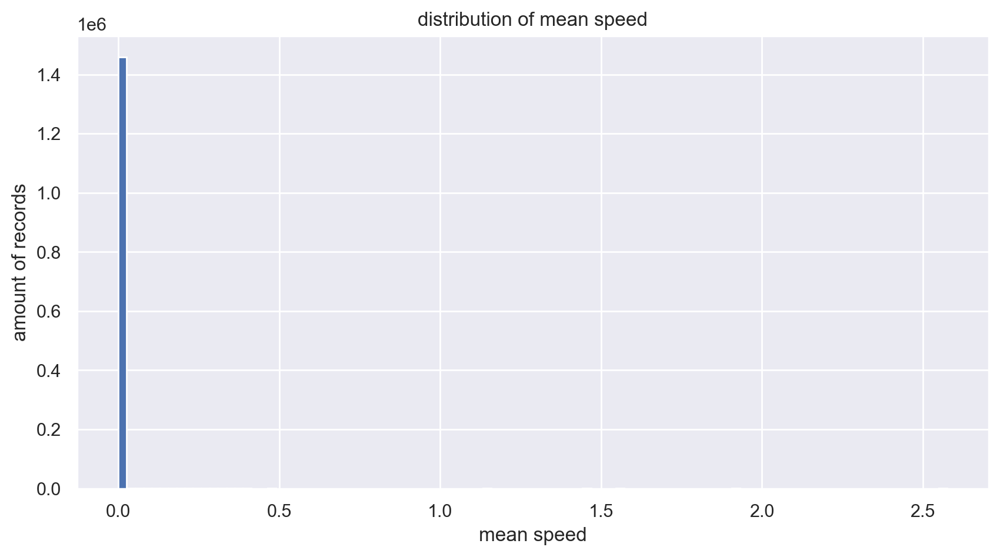

In [26]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
data_train['mean_speed'] = data_train['haversine'] / (np.exp(data_train['log_trip_duration']) - 1)

plt.hist(data_train['mean_speed'], bins=100)
plt.title('distribution of mean speed')
plt.xlabel('mean speed')

plt.ylabel('amount of records')

plt.show()

Как можно видеть по гистограмме, для некоторых объектов у нас получились очень больше значения скоростей. Нарисуйте гистограмму по объектам, для которых значение скорости получилось разумным (например, можно не включать рассмотрение объекты, где скорость больше некоторой квантили):

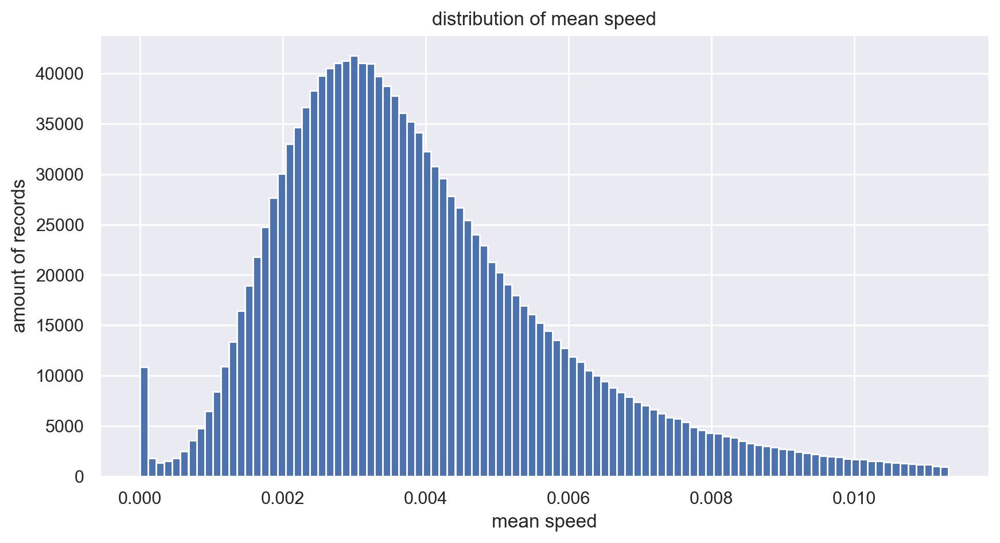

In [27]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
q = np.quantile(data_train['mean_speed'], 0.99)

plt.hist(data_train[data_train['mean_speed'] < q]['mean_speed'], bins=100)
plt.xlabel('mean speed')
plt.ylabel('amount of records')
plt.title('distribution of mean speed')
plt.show()

Для каждой пары (день недели, час суток) посчитайте медиану скоростей. Нарисуйте с помощью `sns.heatmap` график, где по осям будут дни недели и часы, а в качестве значения функции - медиана скорости

<AxesSubplot:xlabel='hour', ylabel='weekday'>

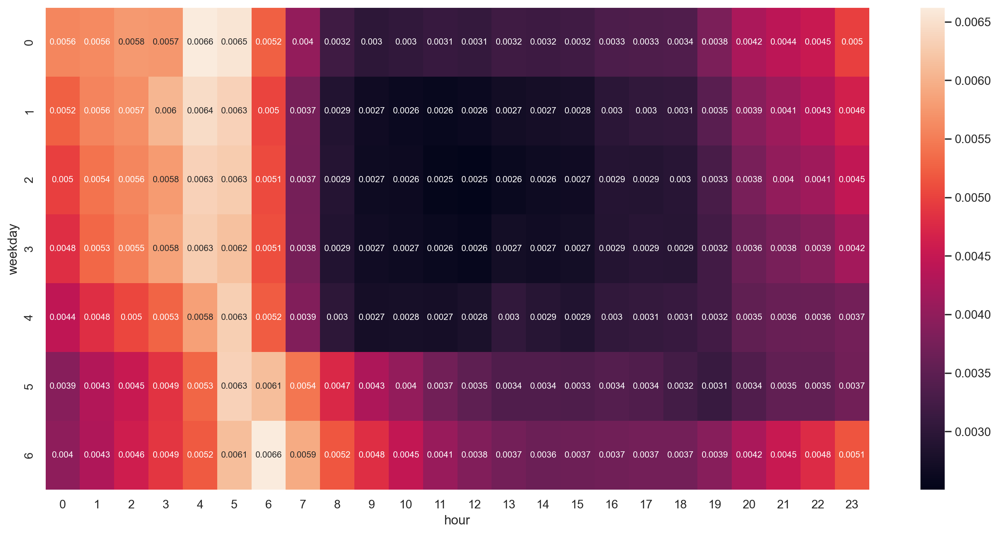

In [28]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
plt.figure(figsize=(17, 8))

median = data_train.groupby(['weekday', 'hour'])['mean_speed'].median().unstack()

sns.heatmap(median, annot=True, annot_kws={"size": 8})

Не забудьте удалить колонку со значением скорости из данных!

**Вопрос**: Почему значение скорости нельзя использовать во время обучения?

#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
Когда мы считали скорости, мы использовали значения целевой переменной

**Вопрос**: Посмотрите внимательно на график и скажите, в какие моменты времени скорость минимальна; максимальна.

1) где-то с 4 до 5 утра скорость максимальна с понедельника по четверг. В пятницу максимальна в 5 часов утра. В выходные дни максимальна с 5 до 6 утра

2) скорость минимальна с 8 до 18 по будням, а также в субботу в 19.




Создайте признаки "поездка совершается в период пробок" и "поездка совершается в период свободных дорог" (естественно, они не должен зависеть от скорости!):

In [29]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

data_train['clear_roads'] = 0

clear_roads_cond = (((data_train['weekday'].isin(range(0, 4)) & data_train['hour'].isin(range(4, 6))) |
                   ((data_train['weekday'] == 4) & (data_train['hour'] == 5))) |
                   (data_train['weekday'].isin(range(5, 7)) & data_train['weekday'].isin(range(5, 7))))

data_train.loc[clear_roads_cond, 'clear_roads'] = 1


traffic_jams_cond = ((data_train['weekday'].isin(range(0, 5)) & data_train['hour'].isin(range(8, 19))) | 
                    ((data_train['weekday'] == 5) & (data_train['hour'] == 19)))


data_train['traffic_jams'] = 0
data_train.loc[traffic_jams_cond, 'traffic_jams'] = 1

In [30]:
data_train.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration,...,month,snowfall,memorial_day,hour,dayofyear,haversine,log_haversine,mean_speed,clear_roads,traffic_jams
333752,id0752048,1,2016-01-01 01:11:29,1,-73.963486,40.768528,-73.969521,40.757580,N,5.616771,...,1,0,0,1,1,1.319222,0.841232,0.004815,0,0
616306,id3056049,1,2016-01-01 13:05:31,1,-73.998032,40.751167,-73.976761,40.751854,N,6.122493,...,1,0,0,13,1,1.793378,1.027252,0.003941,0,1
1391034,id2365766,1,2016-01-01 15:25:38,1,-74.005302,40.728542,-73.978622,40.764221,N,6.976348,...,1,0,0,15,1,4.559729,1.715549,0.004261,0,1
1138825,id3938094,2,2016-01-01 08:37:27,1,-73.977592,40.632847,-73.977592,40.632847,N,6.025866,...,1,0,0,8,1,0.000000,0.000000,0.000000,0,1
537651,id2777099,2,2016-01-01 12:44:13,2,-73.956978,40.770802,-73.979050,40.785332,N,6.293419,...,1,0,0,12,1,2.462602,1.242020,0.004560,0,1


**Задание 8 (0.25 балла)**. Для каждого из замеченных вами выше 2-3 пунктов добавьте в выборку по два признака: 
- началась ли поездка в этом пункте
- закончилась ли поездка в этом пункте

Как вы думаете, почему эти признаки могут быть полезны?

Они однозначно полезны, так как время в пути вероятно будет заметно выше по пути в аэропорт или из него

In [31]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
jfk_latitude = 40.64605414485056
jfk_longitude = -73.77884127543274
side_length = 0.03

min_latitude_jfk = jfk_latitude - side_length / 2
max_latitude_jfk = jfk_latitude + side_length / 2.5

min_longitude_jfk = jfk_longitude - side_length / 1.2
max_longitude_jfk = jfk_longitude + side_length / 2.5


data_train['jfk_starts'] = 0
in_square = (data_train['pickup_latitude'] >= min_latitude_jfk) & \
            (data_train['pickup_latitude'] <= max_latitude_jfk) & \
            (data_train['pickup_longitude'] >= min_longitude_jfk) & \
            (data_train['pickup_longitude'] <= max_longitude_jfk)

data_train.loc[in_square, 'jfk_starts'] = 1


data_train['jfk_ends'] = 0
in_square = (data_train['dropoff_latitude'] >= min_latitude_jfk) & \
            (data_train['dropoff_latitude'] <= max_latitude_jfk) & \
            (data_train['dropoff_longitude'] >= min_longitude_jfk) & \
            (data_train['dropoff_longitude'] <= max_longitude_jfk)

data_train.loc[in_square, 'jfk_ends'] = 1


lga_latitude = 40.7769
lga_longitude = -73.8740

side_length = 0.02

min_latitude = lga_latitude - side_length / 2
max_latitude = lga_latitude + side_length / 2

min_longitude = lga_longitude - side_length / 2
max_longitude = lga_longitude + side_length / 1.5


data_train['lga_starts'] = 0
in_square = (data_train['pickup_latitude'] >= min_latitude) & \
            (data_train['pickup_latitude'] <= max_latitude) & \
            (data_train['pickup_longitude'] >= min_longitude) & \
            (data_train['pickup_longitude'] <= max_longitude)

data_train.loc[in_square, 'lga_starts'] = 1


data_train['lga_ends'] = 0
in_square = (data_train['dropoff_latitude'] >= min_latitude) & \
            (data_train['dropoff_latitude'] <= max_latitude) & \
            (data_train['dropoff_longitude'] >= min_longitude) & \
            (data_train['dropoff_longitude'] <= max_longitude)

data_train.loc[in_square, 'lga_ends'] = 1

Компуктер вижн:

In [32]:
m = folium.Map(location=[lga_latitude, lga_longitude], zoom_start=13)
coordinates = [
    [min_latitude_jfk, min_longitude_jfk],
    [min_latitude_jfk, max_longitude_jfk],
    [max_latitude_jfk, max_longitude_jfk],
    [max_latitude_jfk, min_longitude_jfk],
    [min_latitude_jfk, min_longitude_jfk]
]

folium.PolyLine(coordinates, color="blue", weight=2.5, opacity=1).add_to(m)
m

In [33]:
m = folium.Map(location=[lga_latitude, lga_longitude], zoom_start=13)

coordinates = [
    [min_latitude, min_longitude],
    [min_latitude, max_longitude],
    [max_latitude, max_longitude],
    [max_latitude, min_longitude],
    [min_latitude, min_longitude]
]

folium.PolyLine(coordinates, color="blue", weight=2.5, opacity=1).add_to(m)
m

Для каждого из созданных признаков нарисуйте "ящик с усами" (`sns.boxplot`) распределения логарифма времени поездки

In [34]:
data_train.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration,...,dayofyear,haversine,log_haversine,mean_speed,clear_roads,traffic_jams,jfk_starts,jfk_ends,lga_starts,lga_ends
333752,id0752048,1,2016-01-01 01:11:29,1,-73.963486,40.768528,-73.969521,40.757580,N,5.616771,...,1,1.319222,0.841232,0.004815,0,0,0,0,0,0
616306,id3056049,1,2016-01-01 13:05:31,1,-73.998032,40.751167,-73.976761,40.751854,N,6.122493,...,1,1.793378,1.027252,0.003941,0,1,0,0,0,0
1391034,id2365766,1,2016-01-01 15:25:38,1,-74.005302,40.728542,-73.978622,40.764221,N,6.976348,...,1,4.559729,1.715549,0.004261,0,1,0,0,0,0
1138825,id3938094,2,2016-01-01 08:37:27,1,-73.977592,40.632847,-73.977592,40.632847,N,6.025866,...,1,0.000000,0.000000,0.000000,0,1,0,0,0,0
537651,id2777099,2,2016-01-01 12:44:13,2,-73.956978,40.770802,-73.979050,40.785332,N,6.293419,...,1,2.462602,1.242020,0.004560,0,1,0,0,0,0


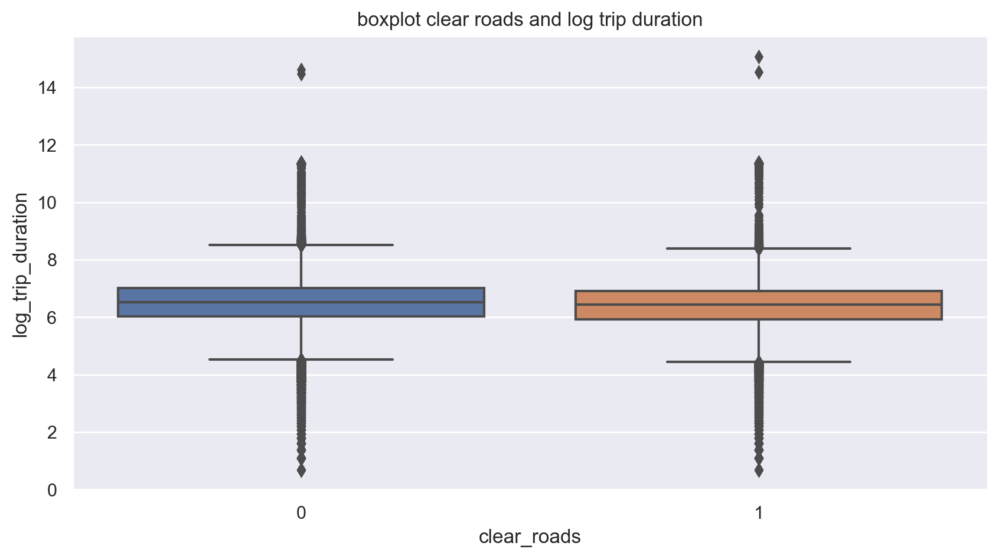

In [35]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
sns.boxplot(x='clear_roads', y='log_trip_duration', data=data_train)
plt.title('boxplot clear roads and log trip duration')
plt.show()

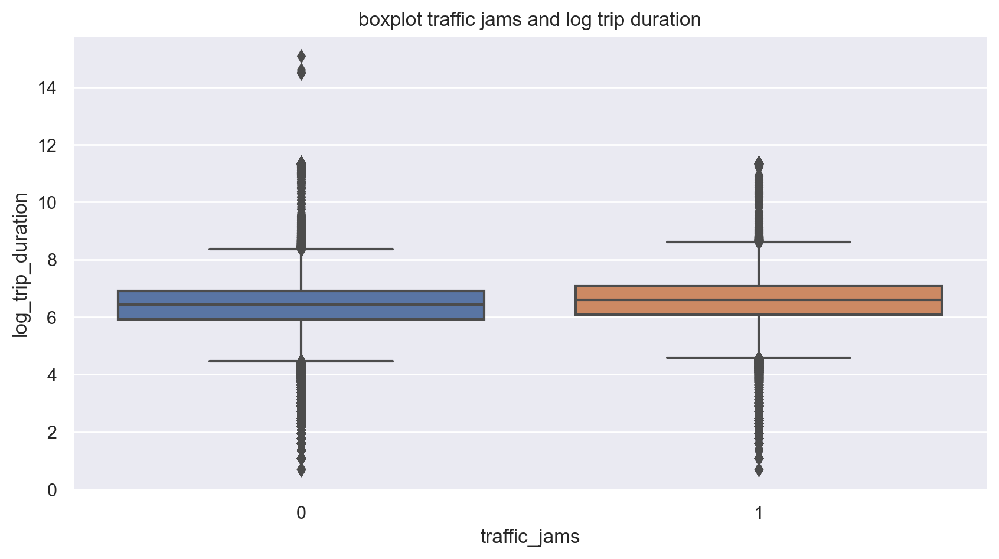

In [36]:
sns.boxplot(x='traffic_jams', y='log_trip_duration', data=data_train)
plt.title('boxplot traffic jams and log trip duration')
plt.show()

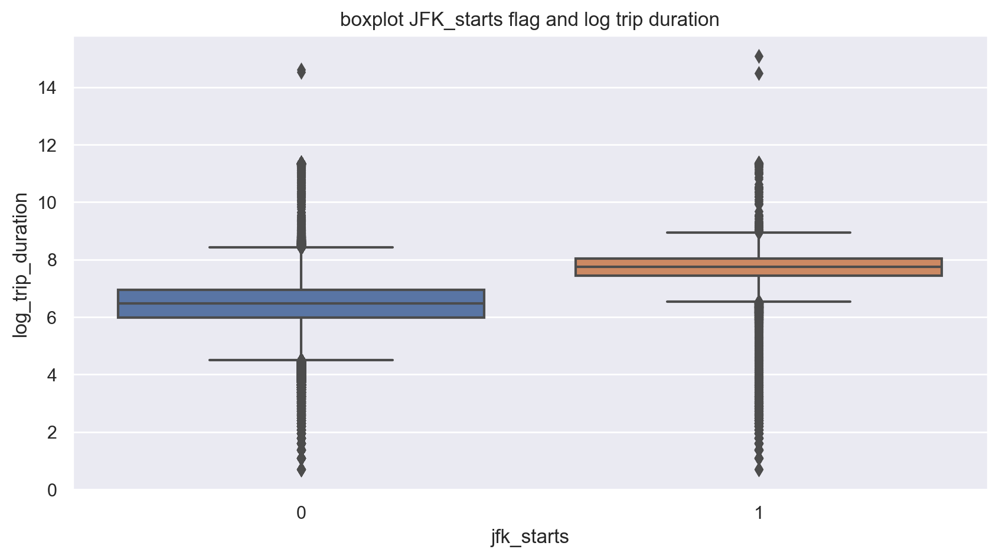

In [37]:
sns.boxplot(x='jfk_starts', y='log_trip_duration', data=data_train)
plt.title('boxplot JFK_starts flag and log trip duration')
plt.show()

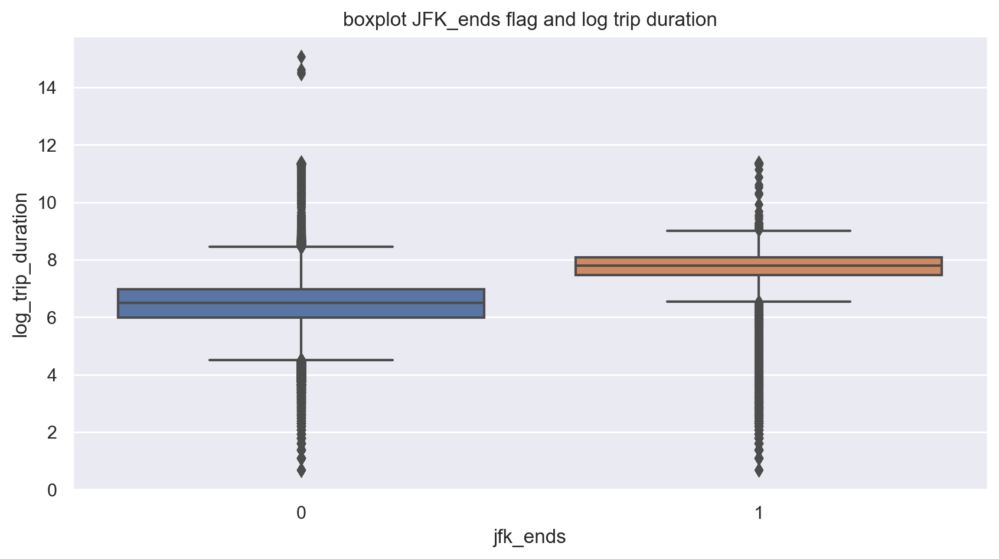

In [38]:
sns.boxplot(x='jfk_ends', y='log_trip_duration', data=data_train)
plt.title('boxplot JFK_ends flag and log trip duration')
plt.show()

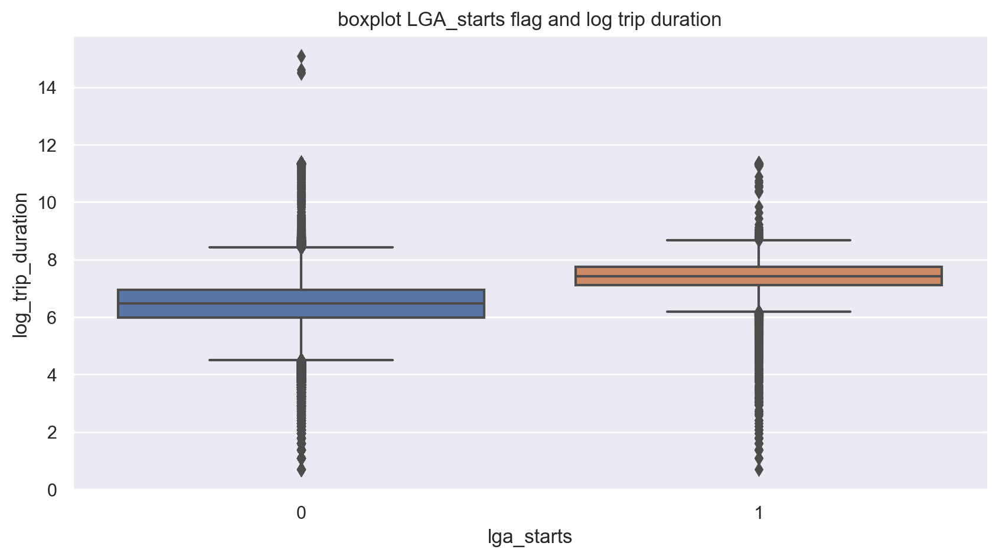

In [39]:
sns.boxplot(x='lga_starts', y='log_trip_duration', data=data_train)
plt.title('boxplot LGA_starts flag and log trip duration')
plt.show()

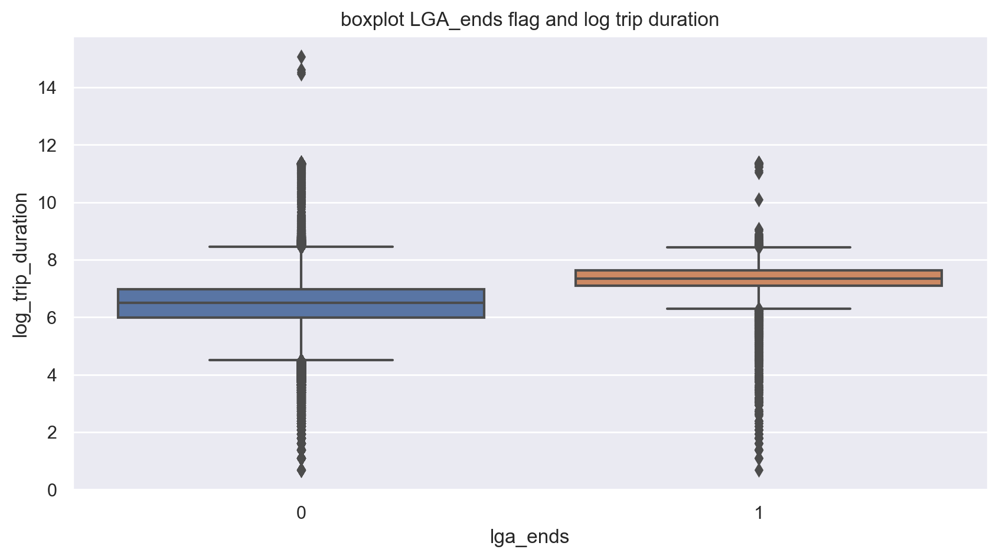

In [40]:
sns.boxplot(x='lga_ends', y='log_trip_duration', data=data_train)
plt.title('boxplot LGA_ends flag and log trip duration')
plt.show()

**Вопрос**: судя по графикам, как вы думаете, хорошими ли получились эти признаки?

Признаки начала или конца поездки в аэропортах получились очень хорошими. Видно, что медианное время заметно вырасло, также как минимум длины поездки.

Признаки пробок менее хороши. Видно, что время в поездки практически не изменилось (разве что чуть-чуть)

<img src="https://www.dropbox.com/s/xson9nukz5hba7c/map.png?raw=1" align="right" width="20%" style="margin-left: 20px; margin-bottom: 20px">

**Задание 9 (1 балл)**. Сейчас мы почти что не используем сами значения координат. На это есть несколько причин: по отдельности рассматривать широту и долготу не имеет особого смысла, стоит рассматривать их вместе. Во-вторых, понятно, что зависимость между нашим таргетом и координатами не линейная. Чтобы как-то использовать координаты, можно прибегнуть к следующему трюку: обрамим область с наибольшим количеством поездок прямоугольником (как на рисунке). Разобьем этот прямоугольник на ячейки. Каждой точке сопоставим номер ее ячейки, а тем точкам, что не попали ни в одну из ячеек, сопоставим значение -1.

Напишите трансформер, который сначала разбивает показанную на рисунке область на ячейки, а затем создает два признака: номер ячейки, в которой началась поездка, и номер ячейки, в которой закончилась поездка. Количество строк и столбцов выберите самостоятельно.

Обратите внимание, что все вычисления должны быть векторизованными, трансформер не должен модифицировать передаваемую ему выборку inplace, а все необходимые статистики (если они вдруг нужны) нужно считать только по обучающей выборке в методе `fit`:

In [41]:
from sklearn.base import BaseEstimator, TransformerMixin


# TransformerMixin implements fit_transform for you,
# applying your fit and transform consistently
    
class MapGridTransformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.point_left_top = (40.80605, -74.01086)
        self.point_right_top = (40.80631, -73.93292)
        self.point_left_bottom = (40.70411, -74.01086)
        self.point_right_bottom = (40.70359, -73.93155)
        self.grid = []
        
    
    def show_cells_with_points(self, data):
        m = self.show_map()
        i = 0
        for _, row in data[(data['square_index_start'] != -1)].iterrows():
            folium.Circle(
                radius=100,
                location=(row['pickup_latitude'], row['pickup_longitude']),
                color='blue',
                fill_color='blue',
                fill=True,
                tooltip=f"{row['square_index_start']}"
            ).add_to(m)

            i += 1

            if i == 200:
                break

        j = 0
        for _, row in data[data['square_index_end'] != -1].iterrows():
            folium.Circle(
                radius=100,
                location=(row['dropoff_latitude'], row['dropoff_longitude']),
                color='green',
                fill_color='green',
                fill=True,
                tooltip=f"{row['square_index_end']}"
            ).add_to(m)
            j += 1

            if j == 200:
                break
        return m
    
    def show_map(self):
        # you may want to visualize cells
        m = folium.Map(location=[lga_latitude, lga_longitude], zoom_start=13)

        for c in self.grid:
            folium.Rectangle(
                bounds=[c[0], c[1]],
                color='#ff7800',
                fill=True,
                fill_color='#ffff00',
                fill_opacity=0.2
            ).add_to(m)
        return m
    
    def fit(self, X=None, y=None):
        return self
    
    
    import numpy as np

    def transform(self, X, y=None):
        delta_lat = (self.point_left_top[0] - self.point_left_bottom[0]) / 4
        delta_lon = (self.point_right_top[1] - self.point_left_top[1]) / 3

        self.grid = []
        for i in range(4):
            for j in range(3):
                top_left = (self.point_left_top[0] - i * delta_lat, self.point_left_top[1] + j * delta_lon)
                bottom_right = (top_left[0] - delta_lat, top_left[1] + delta_lon)
                self.grid.append((top_left, bottom_right))

        square_index_start = np.full(X.shape[0], -1)
        square_index_end = np.full(X.shape[0], -1)
        for i, (top_left, bottom_right) in enumerate(self.grid):
            in_square_pickup = (X['pickup_latitude'] <= top_left[0]) & \
                               (X['pickup_latitude'] >= bottom_right[0]) & \
                               (X['pickup_longitude'] >= top_left[1]) & \
                               (X['pickup_longitude'] <= bottom_right[1])

            in_square_dropoff = (X['dropoff_latitude'] <= top_left[0]) & \
                                (X['dropoff_latitude'] >= bottom_right[0]) & \
                                (X['dropoff_longitude'] >= top_left[1]) & \
                                (X['dropoff_longitude'] <= bottom_right[1])

            square_index_start[in_square_pickup] = i
            square_index_end[in_square_dropoff] = i

        return square_index_start, square_index_end


In [42]:
a = MapGridTransformer()
X = a.transform(data_train)

a.show_map()

In [43]:
data_train['square_index_end'] = X[1]
data_train['square_index_start'] = X[0]

a.show_cells_with_points(data_train)

Добавил еще одну функци, которая визуализирует точки начала и конца поездки в сетке (зеленые - поездка закончилась, синие - началась). Также если навести на точки, то мы увидим номер квадрата. 

Сетку сделал чуть обрезанной, а не как в задании. Таким образом, мы покрываем сеткой только Манхэттен, не задевая другие области

In [44]:
data_train.columns

Index(['id', 'vendor_id', 'pickup_datetime', 'passenger_count',
       'pickup_longitude', 'pickup_latitude', 'dropoff_longitude',
       'dropoff_latitude', 'store_and_fwd_flag', 'log_trip_duration',
       'pickup_date', 'weekday', 'daytime', 'month', 'snowfall',
       'memorial_day', 'hour', 'dayofyear', 'haversine', 'log_haversine',
       'mean_speed', 'clear_roads', 'traffic_jams', 'jfk_starts', 'jfk_ends',
       'lga_starts', 'lga_ends', 'square_index_end', 'square_index_start'],
      dtype='object')

**Задание 10 (0.25 балла)**. Обучите `Ridge`-регрессию со стандартными параметрами на признаках, которые мы выделили к текущему моменту. Категориальные признаки закодируйте через one-hot-кодирование, числовые признаки отмасштабируйте.

In [45]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
categorical_features = ['traffic_jams',
                        'clear_roads',
                        'dayofyear',
                        'weekday',
                        'month',
                        'snowfall',
                        'memorial_day',
                        'daytime',
                        'jfk_starts',
                        'jfk_ends', 
                        'lga_starts', 
                        'lga_ends',
                        'square_index_end',
                        'square_index_start'
                       ]
numeric_features = ['log_haversine']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_features),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline([
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

X_train, X_test, y_train, y_test = train_test_split(data_train[categorical_features + numeric_features],
                                                   data_train['log_trip_duration'],
                                                   train_size=0.7,
                                                   random_state=10)

model = pipeline.fit(X_train, y_train)
y_pred = model.predict(X_test)
print("Test RMSE = %.6f" % mean_squared_error(y_test, y_pred, squared=False))


Test RMSE = 0.473966


## Часть 3. Изучаем оставшиеся признаки (1 балл)

**Задание 11 (0.75 баллов)**. У нас осталось еще 3 признака, которые мы не исследовали: `vendor_id`, `passenger_count` и `store_and_fwd_flag`.

**Вопрос**: Подумайте, почему каждый из этих признаков может быть потенциально полезным.

Честно говоря, признаки так себе, но все же можно придумать +- здравые причины.


1) passenger_count может влиять на длину поездки. Если пассажиров много, то, возможно, водителю нужно будет высадить кого-то по дороге (у метро например). Это немного да удлинняет поездку. Также может быть такое, что если пассажиров очень много, значит тип такси - микроавтобус. У них обычно скорость и маневринность меньше

2) store_and_fwd_flag говорит о том, не было ли у нас проблем с интернетом. Если они были, то, возможно, в это время также не работал навигатор и водитель мог свернуть не туда или выбрать не самый оптимальный маршрут 

3) vendor_id - ну, например, у некоторых провайдеров могут быть не самые лучшие алгоритмы построения пути. Или же они с погрешностью определяют это время. 

Посчитайте, сколько есть уникальных значений у каждого из этих признаков:

In [46]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
data_train['vendor_id'].unique()

array([1, 2])

In [47]:
data_train['passenger_count'].unique()

array([1, 2, 3, 6, 4, 5, 8, 0, 7, 9])

In [48]:
data_train['store_and_fwd_flag'].unique()

array(['N', 'Y'], dtype=object)

Постройте "ящики с усами" распределений логарифма времени поездки в зависимости от значений каждого из признаков

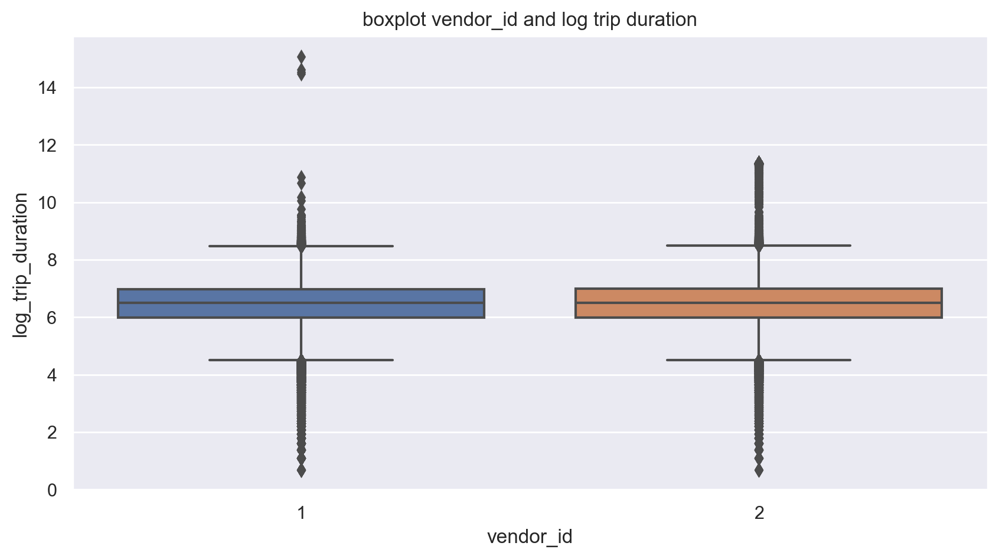

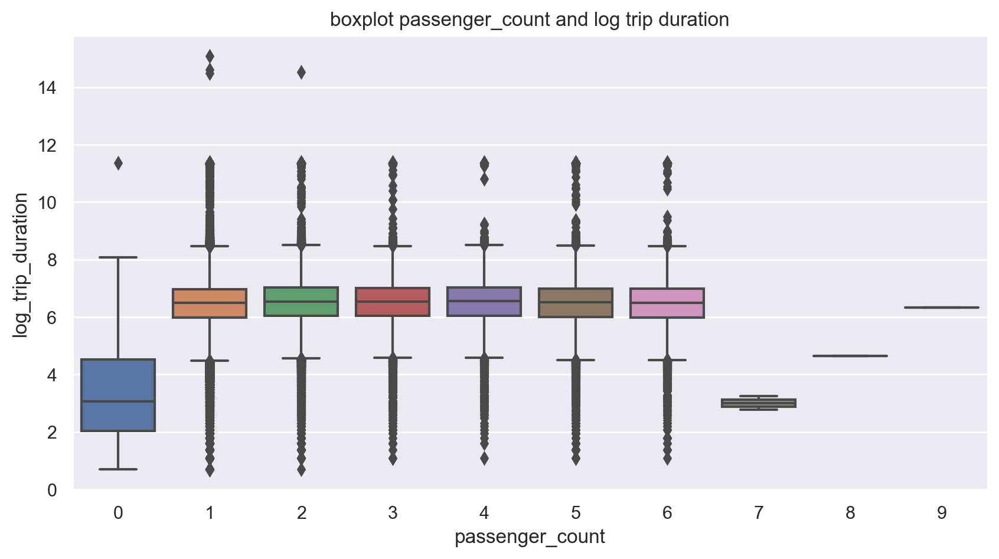

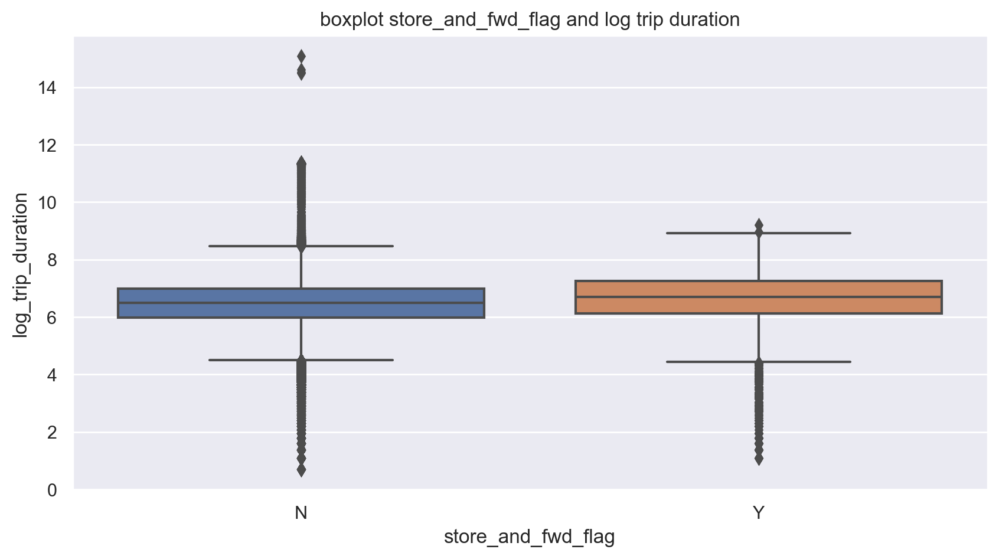

In [49]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
sns.boxplot(x='vendor_id', y='log_trip_duration', data=data_train)
plt.title('boxplot vendor_id and log trip duration')
plt.show()

sns.boxplot(x='passenger_count', y='log_trip_duration', data=data_train)
plt.title('boxplot passenger_count and log trip duration')
plt.show()

sns.boxplot(x='store_and_fwd_flag', y='log_trip_duration', data=data_train)
plt.title('boxplot store_and_fwd_flag and log trip duration')
plt.show()


Переведите признаки `vendor_id` и `store_and_fwd_flag` в значения $\{0;1\}$

In [50]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
data_train['vendor_id'] -= 1
data_train['store_and_fwd_flag'] = np.where(data_train['store_and_fwd_flag'] == 'N', 0, 1)

**Вопрос**: Основываясь на графиках выше, как вы думаете, будут ли эти признаки сильными?

Кажется что единственный более-менее нормальный признак - это количество пассажиров, так как для них есть существенная разница. Однако она наблюдается только на 0 пассажиров и на > 6. 

Оставльные признаки почти не влияют на время в пути, поэтому кажется что они не будут полезны.

**Задание 12 (0.25 баллов)**. Проверьте свои предположения, обучив модель в том числе и на этих трех признаках. Обучайте `Ridge`-регрессию со стандартными параметрами. Категориальные признаки закодируйте one-hot-кодированием, а численные отмасштабируйте.

In [53]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
categorical_features = ['traffic_jams',
                        'clear_roads',
                        'dayofyear',
                        'weekday',
                        'month',
                        'snowfall',
                        'memorial_day',
                        'daytime',
                        'jfk_starts',
                        'jfk_ends', 
                        'lga_starts', 
                        'lga_ends',
                        'square_index_end',
                        'square_index_start',
                        'vendor_id',
                        'store_and_fwd_flag',
                        'passenger_count',
                       ]

numeric_features = ['log_haversine']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_features),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline([
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

X_train, X_test, y_train, y_test = train_test_split(data_train,
                                                   data_train['log_trip_duration'],
                                                   train_size=0.7,
                                                   random_state=10)

model = pipeline.fit(X_train[categorical_features + numeric_features], y_train)
y_pred = model.predict(X_test[categorical_features + numeric_features])
print("Test RMSE = %.6f" % mean_squared_error(y_test, y_pred, squared=False))

Test RMSE = 0.473600


Если признаки не дали какого-то ощутимого улучшения метрики, их можно выбросить из данных.

In [54]:
X_test = X_test.drop('store_and_fwd_flag', axis=1)
X_test = X_test.drop('passenger_count', axis=1)
X_test = X_test.drop('vendor_id', axis=1)

X_train = X_train.drop('store_and_fwd_flag', axis=1)
X_train = X_train.drop('passenger_count', axis=1)
X_train = X_train.drop('vendor_id', axis=1)

In [55]:
categorical_features = ['traffic_jams',
                        'clear_roads',
                        'dayofyear',
                        'weekday',
                        'month',
                        'snowfall',
                        'memorial_day',
                        'daytime',
                        'jfk_starts',
                        'jfk_ends', 
                        'lga_starts', 
                        'lga_ends',
                        'square_index_end',
                        'square_index_start',
#                         'vendor_id',
#                         'store_and_fwd_flag',
#                         'passenger_count',
                       ]

numeric_features = ['log_haversine']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_features),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline([
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

X_train, X_test, y_train, y_test = train_test_split(data_train,
                                                   data_train['log_trip_duration'],
                                                   train_size=0.7,
                                                   random_state=10)

model = pipeline.fit(X_train[categorical_features + numeric_features], y_train)
y_pred = model.predict(X_test[categorical_features + numeric_features])
print("Test RMSE = %.6f" % mean_squared_error(y_test, y_pred, squared=False))

Test RMSE = 0.473966


## Часть 4. Улучшаем модель (3 балла)

**Задание 13 (1 балл)**. В наших данных есть нетипичные объекты (выбросы, или outliers): с аномально маленьким времени поездки, с очень большим пройденным расстоянием или очень большими остатками регрессии. В этом задании предлагается исключить такие объекты из обучающей выборки. Для этого нарисуйте гистограммы распределения упомянутых выше величин, выберите объекты, которые можно назвать выбросами, и очистите __обучающую выборку__ от них.

Отметим, что хотя эти объекты и выглядят как выбросы, в тестовой выборке тоже скорее всего будут объекты с такими же странными значениями целевой переменной и/или признаков. Поэтому, возможно, чистка обучающей выборки приведёт к ухудшению качества на тесте. Тем не менее, всё равно лучше удалять выбросы из обучения, чтобы модель получалась более разумной и интерпретируемой.

In [56]:
X_train['log_trip_duration'] = y_train
y_pred_for_train = model.predict(X_train)

X_train['log_trip_duration_pred'] = y_pred_for_train

# Обрезаем log_trip_duration

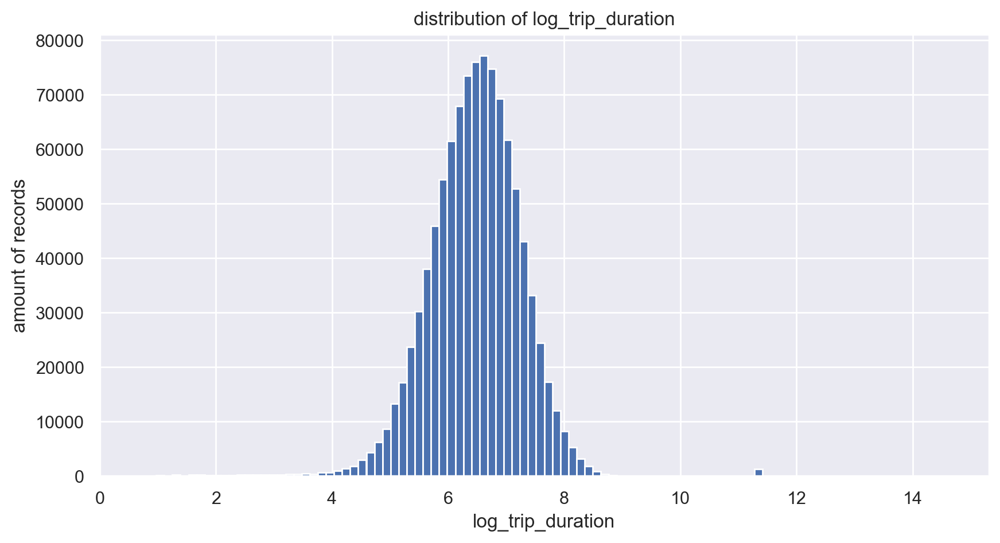

In [57]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
plt.hist(X_train['log_trip_duration'], bins=100)
plt.xlabel('log_trip_duration')
plt.ylabel('amount of records')
plt.title('distribution of log_trip_duration')
plt.show()

In [58]:
log_trip_duration = X_train['log_trip_duration']
mean = np.mean(log_trip_duration)
std_deviation = np.std(log_trip_duration)

lower_bound = mean - 3 * std_deviation
upper_bound = mean + 3 * std_deviation

print(lower_bound)
print(upper_bound)

4.077401479471207
8.85661955606


Text(0.5, 1.0, 'boxplot for log_trip_duration')

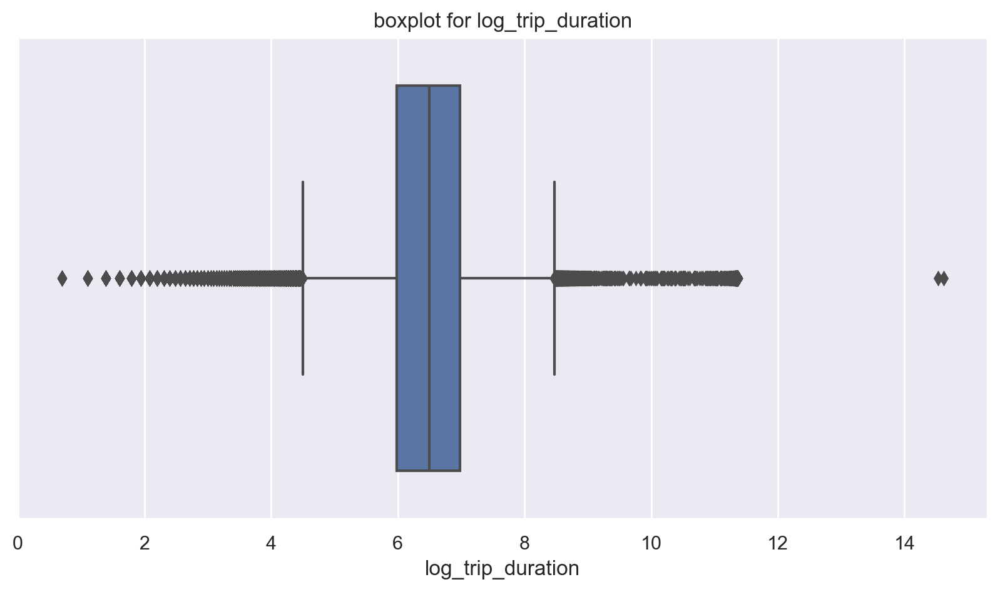

In [59]:
sns.boxplot(x='log_trip_duration', data=X_train)
plt.title('boxplot for log_trip_duration')

In [60]:
log_trip_duration = X_train['log_trip_duration']

Q1 = np.percentile(log_trip_duration, 25)
Q3 = np.percentile(log_trip_duration, 75)

IQR = Q3 - Q1

lower_bound_box = Q1 - 1.5 * IQR
upper_bound_box = Q3 + 1.5 * IQR

print(lower_bound_box)
print(upper_bound_box)

4.493227997476511
8.475158684964315


In [61]:
X_train = X_train[(X_train['log_trip_duration'] >= lower_bound) & (X_train['log_trip_duration'] <= upper_bound)]

Text(0.5, 1.0, 'boxplot for log_trip_duration')

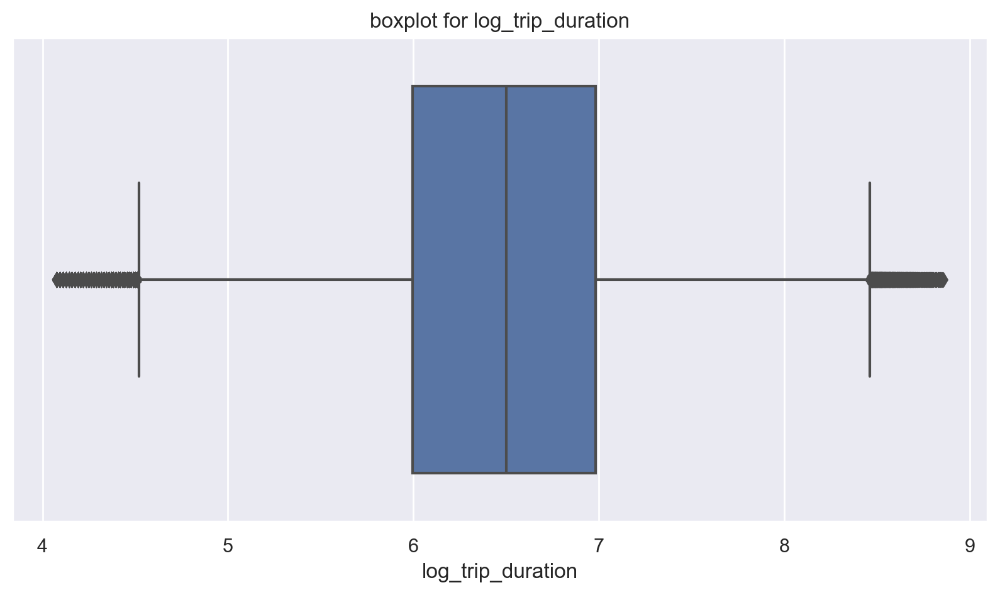

In [62]:
sns.boxplot(x='log_trip_duration', data=X_train)
plt.title('boxplot for log_trip_duration')

Тут можно предложить два подхода: либо обрезать по значению усов, либо же воспользоваться правилом трех сигм. Ну вроде тут +- одинаковые пороговые значения. Выберем правило трех сигм, так как оно все-таки помягче обрезает

# Обрезаем расстояние

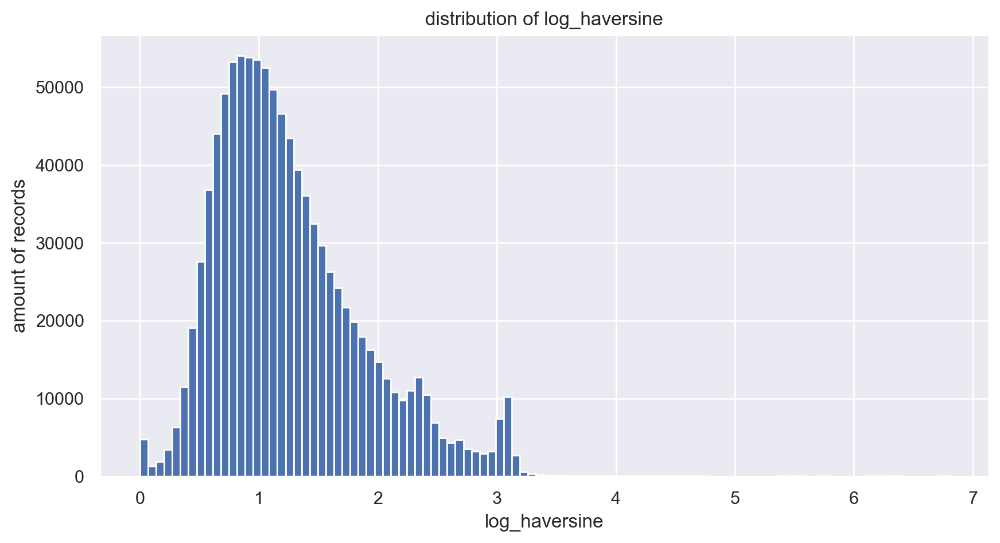

In [63]:
plt.hist(X_train['log_haversine'], bins=100)
plt.xlabel('log_haversine')
plt.ylabel('amount of records')
plt.title('distribution of log_haversine')
plt.show()

Text(0.5, 1.0, 'boxplot for log_haversine')

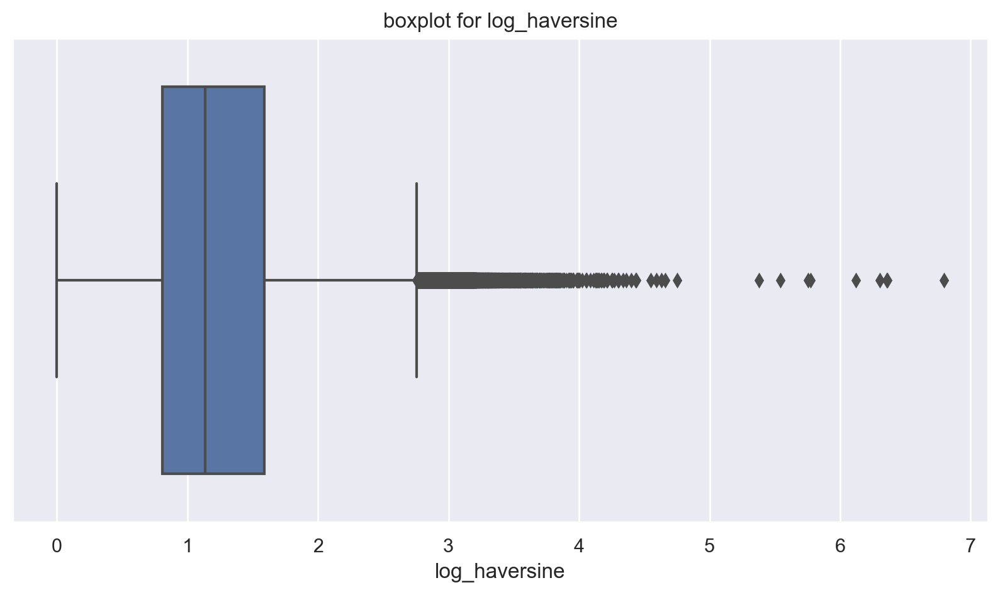

In [64]:
sns.boxplot(x='log_haversine', data=X_train)
plt.title('boxplot for log_haversine')

Видим, что выбросы есть только справа. Обрежем их используя то же правило трех сигм

In [65]:
log_haversine = X_train['log_haversine']
mean = np.mean(log_haversine)
std_deviation = np.std(log_haversine)

upper_bound = mean + 3 * std_deviation

print(upper_bound)

3.129440488969652


In [66]:
X_train = X_train[X_train['log_haversine'] < upper_bound]

Text(0.5, 1.0, 'boxplot for log_haversine')

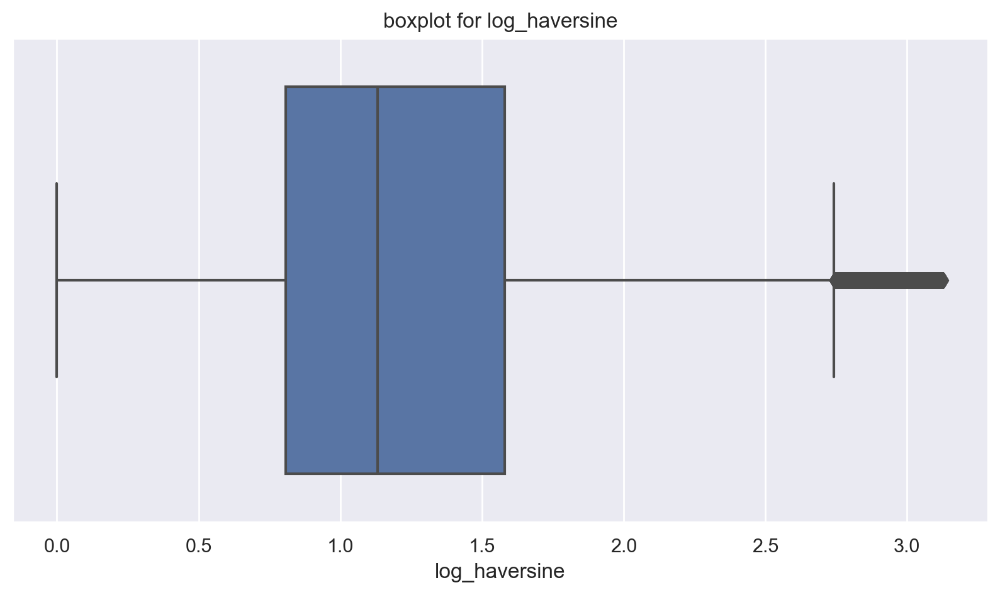

In [67]:
sns.boxplot(x='log_haversine', data=X_train)
plt.title('boxplot for log_haversine')

# Обрезаем остатки регрессии

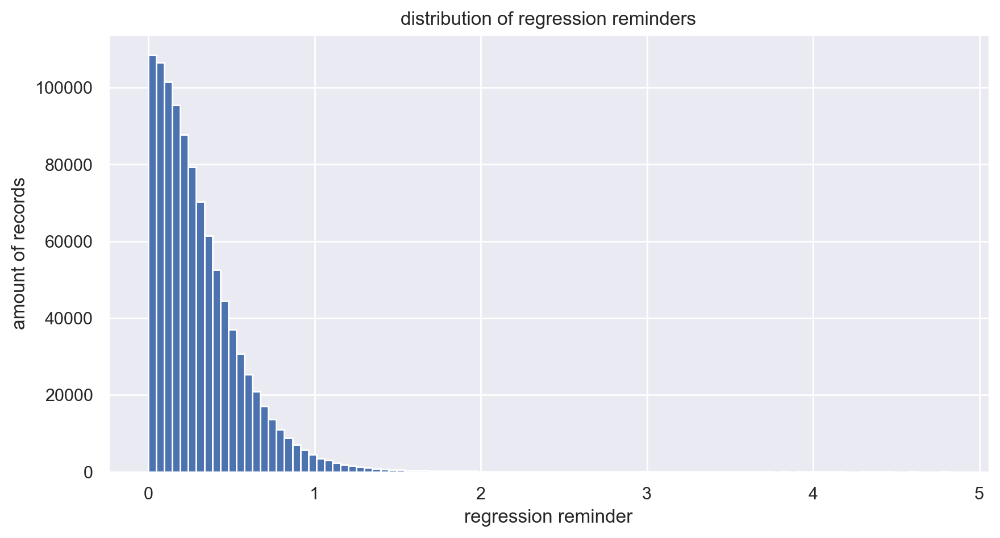

In [68]:
plt.hist(np.abs(X_train['log_trip_duration'] - X_train['log_trip_duration_pred']), bins=100)
plt.xlabel('regression reminder')
plt.ylabel('amount of records')
plt.title('distribution of regression reminders')
plt.show()

Text(0.5, 0, 'reminders')

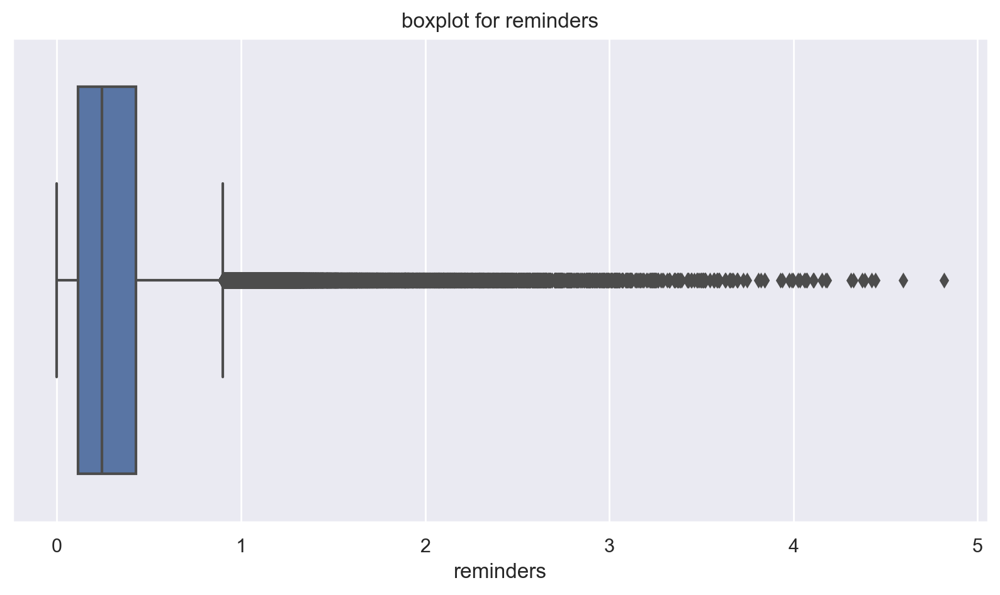

In [69]:
sns.boxplot(x=np.abs(X_train['log_trip_duration'] - X_train['log_trip_duration_pred']))
plt.title('boxplot for reminders')
plt.xlabel('reminders')

In [70]:
reminder = np.abs(X_train['log_trip_duration'] - X_train['log_trip_duration_pred'])
mean = np.mean(reminder)
std_deviation = np.std(reminder)

upper_bound = mean + 3 * std_deviation

print(upper_bound)

1.1138033728972943


In [71]:
X_train = X_train[np.abs(X_train['log_trip_duration'] - X_train['log_trip_duration_pred']) < upper_bound]

Text(0.5, 0, 'reminders')

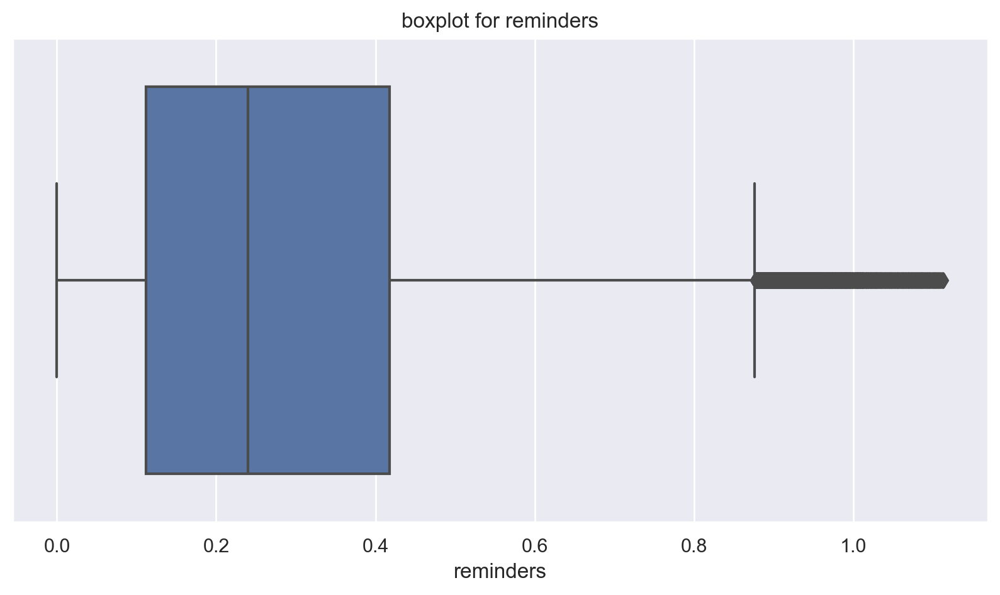

In [72]:
sns.boxplot(x=np.abs(X_train['log_trip_duration'] - X_train['log_trip_duration_pred']))
plt.title('boxplot for reminders')
plt.xlabel('reminders')

Сейчас у нас очень много категориальных признаков. В категориальных признаках могут содержаться редкие категории, обычно это плохо: модель сильно переобучается на таких примерах. Для каждого категориального признака объедините действительно редкие категории в одну, если такие имеются (т.е. если категории действительно редкие). 

In [73]:
X_train['lga_ends'].value_counts()

0    983868
1     11912
Name: lga_ends, dtype: int64

In [74]:
X_train['lga_starts'].value_counts()

0    971210
1     24570
Name: lga_starts, dtype: int64

In [75]:
X_train['jfk_ends'].value_counts()

0    988843
1      6937
Name: jfk_ends, dtype: int64

In [76]:
X_train['jfk_starts'].value_counts()

0    976926
1     18854
Name: jfk_starts, dtype: int64

Давайте не будем делить на ends и starts, а сделаем два признака: jfk и lga

In [77]:
X_train['jfk'] = X_train['jfk_starts'] + X_train['jfk_ends']
X_train.loc[X_train['jfk'] == 2, 'jfk'] -= 1 

X_train['lga'] = X_train['lga_starts'] + X_train['lga_ends']
X_train.loc[X_train['lga'] == 2, 'lga'] -= 1

X_test['jfk'] = X_test['jfk_starts'] + X_test['jfk_ends']
X_test.loc[X_test['jfk'] == 2, 'jfk'] -= 1 

X_test['lga'] = X_test['lga_starts'] + X_test['lga_ends']
X_test.loc[X_test['lga'] == 2, 'lga'] -= 1 

In [78]:
X_train = X_train.drop('jfk_starts', axis=1)
X_train = X_train.drop('jfk_ends', axis=1)
X_train = X_train.drop('lga_starts', axis=1)
X_train = X_train.drop('lga_ends', axis=1)

X_test = X_test.drop('jfk_starts', axis=1)
X_test = X_test.drop('jfk_ends', axis=1)
X_test = X_test.drop('lga_starts', axis=1)
X_test = X_test.drop('lga_ends', axis=1)

In [79]:
X_train['dayofyear'].value_counts()

100    6660
65     6589
107    6539
93     6412
72     6392
       ... 
3      4245
25     4153
151    3762
24     2274
23     1111
Name: dayofyear, Length: 182, dtype: int64

Это я бы оставил как есть. Как-то странно и неуместно объединять всего пару дней в один

In [80]:
X_train['weekday'].value_counts()

4    152386
5    150730
3    149176
2    143528
1    138453
6    133120
0    128387
Name: weekday, dtype: int64

+- равномерно. Оставляем

In [81]:
X_train['month'].value_counts()

3    175212
4    171789
5    169391
2    162901
6    159640
1    156847
Name: month, dtype: int64

Тоже равномерно

In [82]:
X_train['daytime'].value_counts()

19    61912
18    61813
21    57667
20    57639
22    55179
17    51970
14    50604
12    49023
15    48964
13    48824
23    47847
11    46821
9     46263
8     45941
10    44615
16    43685
7     37956
0     36222
1     26134
6     22599
2     19015
3     14179
4     10674
5     10234
Name: daytime, dtype: int64

In [83]:
X_train['square_index_end'].value_counts()

 4     203324
 6     184101
-1     140191
 7     112369
 9      90139
 3      69585
 5      63926
 1      56747
 2      42776
 10     18707
 11      8365
 8       5399
 0        151
Name: square_index_end, dtype: int64

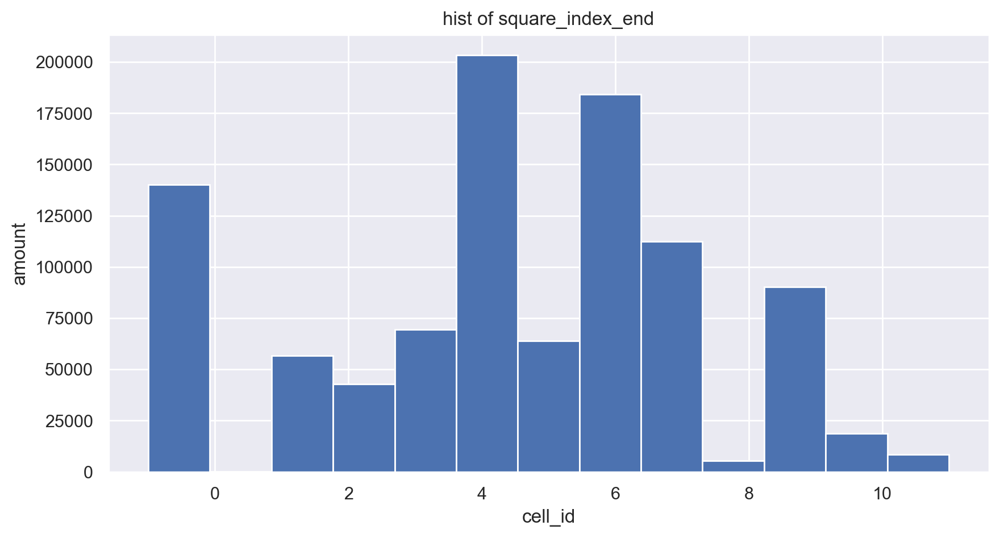

In [84]:
plt.hist(np.sort(X_train['square_index_end'].values), bins=13)
plt.title('hist of square_index_end')
plt.ylabel('amount')
plt.xlabel('cell_id')
plt.show()

Ну давайте 0, 8, 11 склеим

In [85]:
X_test.loc[X_test['square_index_end'].isin([0, 8, 11]), 'square_index_end'] = 0

In [86]:
X_train['square_index_start'].value_counts()

 4     221671
 6     218141
 7     113017
 9     104448
-1      94948
 3      72683
 5      63880
 1      57435
 2      31158
 10     12320
 11      3510
 8       2539
 0         30
Name: square_index_start, dtype: int64

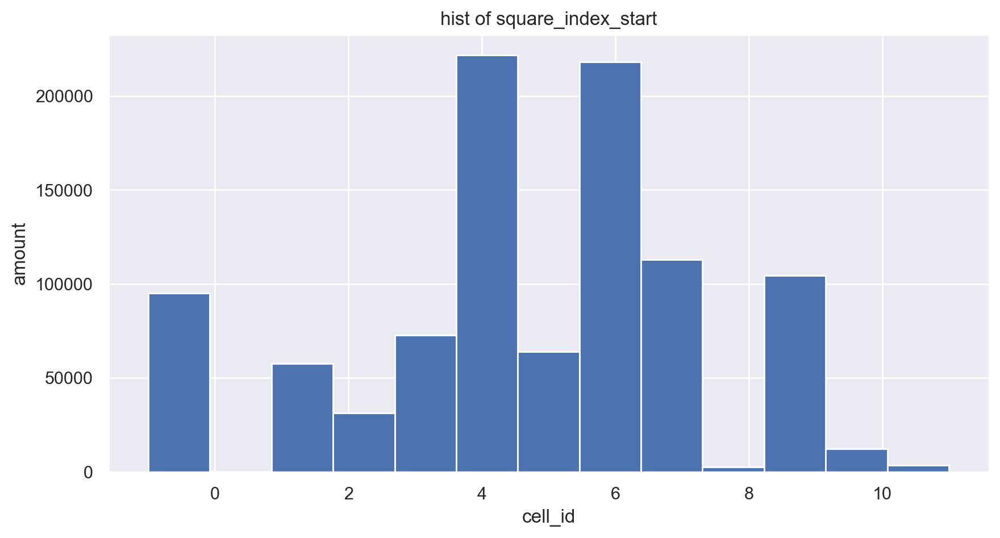

In [87]:
plt.hist(np.sort(X_train['square_index_start'].values), bins=13)
plt.title('hist of square_index_start')
plt.ylabel('amount')
plt.xlabel('cell_id')
plt.show()

In [88]:
X_test.loc[X_test['square_index_start'].isin([0, 8, 11]), 'square_index_start'] = 0

Обучите модель на очищенных данных и посчитайте качество на тестовой выборке.

In [89]:
categorical_features = ['traffic_jams',
                        'clear_roads',
                        'dayofyear',
                        'weekday',
                        'month',
                        'snowfall',
                        'memorial_day',
                        'daytime',
                        'jfk',
                        'lga', 
                        'square_index_end',
                        'square_index_start',
                       ]

numeric_features = ['log_haversine']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_features),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline([
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

y_train = X_train['log_trip_duration']
model = pipeline.fit(X_train[categorical_features + numeric_features], y_train)
y_pred = model.predict(X_test[categorical_features + numeric_features])
print("Test RMSE = %.6f" % mean_squared_error(y_test, y_pred, squared=False))

Test RMSE = 0.474726


**Задание 14 (1 балл)**. После OneHot-кодирования количество признаков в нашем датасете сильно возрастает. Посчитайте колиество признаков до и после кодирования категориальных признаков.

In [90]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
column_transformer = ColumnTransformer([
    ("ohe", OneHotEncoder(handle_unknown='ignore'), categorical_features)
])

print('До', len(categorical_features))
print('После', column_transformer.fit_transform(X_train[categorical_features]).shape[1])

До 12
После 257


Попробуйте обучить не `Ridge`-, а `Lasso`-регрессию. Какой метод лучше?

In [91]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
from sklearn.linear_model import Lasso

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), categorical_features),
    ('scaling', StandardScaler(), numeric_features)
])

lasso_pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Lasso())
])

model = lasso_pipeline.fit(X_train[categorical_features + numeric_features], y_train)
y_pred = model.predict(X_test[categorical_features + numeric_features])
print("RMSE = %.4f" % mean_squared_error(y_test, y_pred, squared=False))

RMSE = 0.7940


Ridge регрессия сильно лучше, так как показывает ошибку намного меньше

Разбейте _обучающую выборку_ на обучающую и валидационную в отношении 8:2. По валидационной выборке подберите оптимальные значения параметра регуляризации (по логарифмической сетке) для `Ridge` и `Lasso`, на тестовой выборке измерьте качество лучшей полученной модели.

Сделаем grid search по сетке с использованием кросс-валидации. Используем параметр CV=5 который делит тест ровно 4:1, что нам и нужно

In [325]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_features),
    ('scaling', StandardScaler(), numeric_features)
])

ridge_pipeline = Pipeline([
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

lasso_pipeline = Pipeline([
    ('ohe_and_scaling', column_transformer),
    ('regression', Lasso())
])

alphas = np.logspace(-3, 3, 20)
ridge_params = {'regression__alpha': alphas}

ridge_search = GridSearchCV(estimator=ridge_pipeline, param_grid=ridge_params, cv=5,  verbose=1, n_jobs=-1, scoring='neg_mean_squared_error', return_train_score=True)

y_train = X_train['log_trip_duration']

ridge_search.fit(X_train[categorical_features + numeric_features], y_train)

best_alpha = ridge_search.best_params_['regression__alpha']
print(best_alpha)


Fitting 5 folds for each of 20 candidates, totalling 100 fits
26.366508987303554


In [329]:
alphas = np.logspace(-4, 0, 20)

lasso_params = {'regression__alpha': alphas}
lasso_search = GridSearchCV(estimator=lasso_pipeline, param_grid=lasso_params, cv=5, verbose=1, n_jobs=-1, scoring='neg_mean_squared_error', return_train_score=True)

lasso_search.fit(X_train[categorical_features + numeric_features], y_train)

best_alpha = lasso_search.best_params_['regression__alpha']
print(best_alpha)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
0.0001


In [332]:
y_pred = ridge_search.predict(X_test[categorical_features + numeric_features])

print("RMSE = %.6f" % mean_squared_error(y_test, y_pred, squared=False))

RMSE = 0.472963


In [333]:
y_pred = lasso_search.predict(X_test[categorical_features + numeric_features])

print("RMSE = %.6f" % mean_squared_error(y_test, y_pred, squared=False))

RMSE = 0.473217


Для каждого перебранного `alpha` для Lasso посчитайте количество нулевых весов в модели и нарисуйте график зависимости его от `alpha`. Как сильно придётся потерять в качестве, если мы хотим с помощью Lasso избавиться хотя бы от половины признаков?

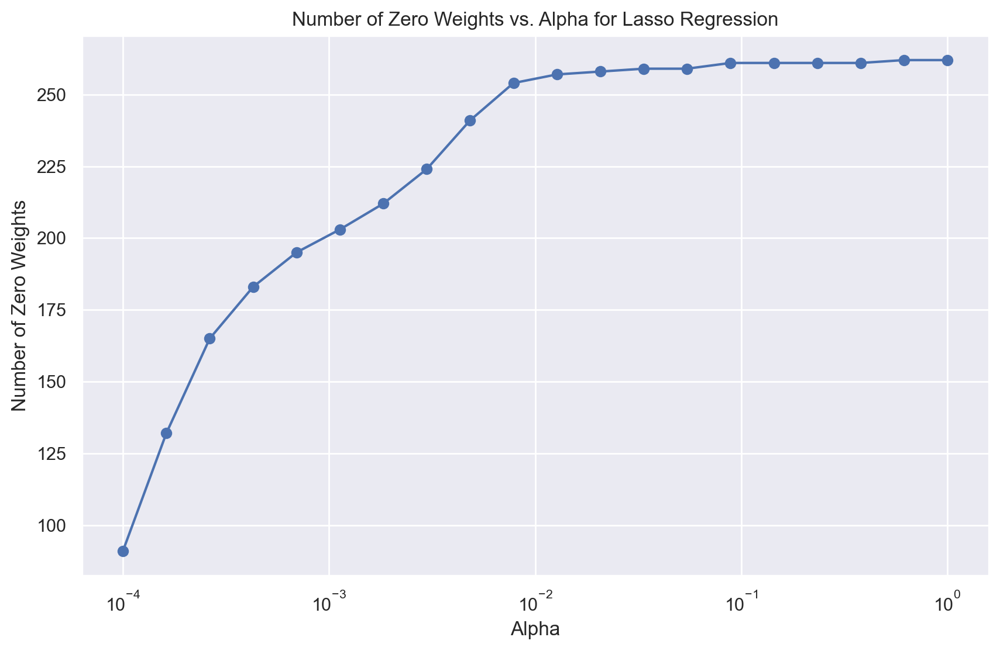

In [475]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
zero_weights_count = []
rmse_list = []

alphas = np.logspace(-4, 0, 20)


for alpha in alphas:
    lasso_pipeline.set_params(regression__alpha=alpha)
    model = lasso_pipeline.fit(X_train[categorical_features + numeric_features], y_train)
    coef = lasso_pipeline.named_steps['regression'].coef_
    zero_weights_count.append(np.sum(coef == 0))
    rmse_list.append(mean_squared_error(y_test, model.predict(X_test), squared=False))

plt.figure(figsize=(10, 6))
plt.plot(alphas, zero_weights_count, '-o')
plt.xscale('log')
plt.xlabel('Alpha')
plt.ylabel('Number of Zero Weights')
plt.title('Number of Zero Weights vs. Alpha for Lasso Regression')
plt.show()

In [476]:
rmse_list

[0.47321686154611087,
 0.473521356148141,
 0.4739637277902156,
 0.47467445909539857,
 0.4757241114530965,
 0.4777185724749422,
 0.4812047025034326,
 0.48750129439855455,
 0.49365051718690306,
 0.4996163379768052,
 0.5043169006264416,
 0.5079532183962578,
 0.5132069128653051,
 0.5234740339606039,
 0.5353609889698384,
 0.5492310216449318,
 0.583021410689233,
 0.6622003099863254,
 0.7940241973722946,
 0.7940241973722946]

In [477]:
zero_weights_count

[91,
 132,
 165,
 183,
 195,
 203,
 212,
 224,
 241,
 254,
 257,
 258,
 259,
 259,
 261,
 261,
 261,
 261,
 262,
 262]

Получилось, что если мы зануляем 132 признака, то получаем ошибку равную 0.473521356148141



<img src="https://www.dropbox.com/s/wp4jj0599np17lh/map_direction.png?raw=1" width="20%" align="right" style="margin-left: 20px">

**Задание 15 (1 балл)**. Часто бывает полезным использовать взаимодействия признаков (feature interactions), то есть строить новые признаки на основе уже существующих. Выше мы разбили карту Манхэттена на ячейки и придумали признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка".

Давайте попробуем сделать следующее: посчитаем, сколько раз встречается каждая возможная пара этих признаков в нашем датасете и выберем 100 самых частых пар. Закодируем поездки с этими частыми парами как категориальный признак, остальным объектам припишем -1. Получается, что мы закодировали, откуда и куда должно было ехать такси.

Также можете придумать ещё какой-нибудь способ сделать признаки про маршрут. Если эти признаки будут давать хороший прирост в качестве, то за это могут быть даны дополнительные бонусные баллы.

**Вопрос**: Почему такой признак потенциально полезный? Почему линейная модель не может самостоятельно "вытащить" эту информацию, ведь у нее в распоряжении есть признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка"?


Признак весьма полезный, так как потенциальное время в поездке для популярных направлений всегда +- похоже.

Раньше мы не учитывали такие ситуации, так как подбирали веса для pickup и dropoff независимо, не учитывая, что две точки могут быть связаны

In [92]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
pairs = data_train.groupby(['square_index_end', 'square_index_start']).size().reset_index().rename(columns={0: 'size'})
pairs = pairs.sort_values(by='size', ascending=False).reset_index()
pairs = pairs.head(100)

In [93]:
pairs['code'] = pairs['square_index_start'].astype(str) + pairs['square_index_end'].astype(str)

In [94]:
pairs_array = pairs['code']
pairs_array = np.array(pairs_array.to_list())
pairs_array

array(['44', '66', '-1-1', '64', '67', '46', '69', '76', '96', '47',
       '6-1', '99', '45', '74', '77', '4-1', '54', '63', '9-1', '34',
       '43', '41', '36', '11', '14', '55', '-14', '42', '7-1', '97', '33',
       '-16', '79', '3-1', '49', '-19', '94', '24', '52', '1-1', '-17',
       '75', '37', '73', '57', '22', '65', '610', '12', '-13', '910',
       '5-1', '25', '31', '61', '56', '93', '51', '13', '-11', '2-1',
       '15', '39', '21', '62', '16', '-15', '-12', '106', '109', '710',
       '72', '95', '35', '911', '71', '10-1', '59', '53', '17', '-111',
       '107', '32', '-110', '26', '11-1', '27', '410', '91', '-18', '611',
       '92', '8-1', '48', '1010', '23', '19', '1111', '104', '68'],
      dtype='<U4')

In [95]:
X_test['code'] = X_test['square_index_start'].astype(str) + X_test['square_index_end'].astype(str)
X_train['code'] = X_train['square_index_start'].astype(str) + X_train['square_index_end'].astype(str)

In [96]:
X_train.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration,...,log_haversine,mean_speed,clear_roads,traffic_jams,square_index_end,square_index_start,log_trip_duration_pred,jfk,lga,code
1053814,id2022437,0,2016-04-12 21:16:24,1,-74.013290,40.704880,-73.975784,40.788879,0,8.232440,...,2.385110,0.002622,0,0,1,-1,7.451358,0,0,-11
64662,id2963815,1,2016-03-22 13:08:38,3,-73.999603,40.734211,-74.005463,40.745152,0,6.070738,...,0.838493,0.003039,0,1,6,6,6.292201,0,0,66
1425917,id2878210,1,2016-03-27 19:21:39,1,-73.971405,40.751026,-73.987976,40.750793,0,6.102559,...,0.873852,0.003130,1,0,6,7,6.023369,0,0,76
219223,id3461516,0,2016-05-21 17:22:15,2,-73.988449,40.718719,-73.974472,40.730099,0,7.344719,...,1.003818,0.001117,1,0,7,9,6.326725,0,0,97
908719,id2516891,1,2016-01-26 22:23:24,2,-73.970306,40.762249,-73.984123,40.744282,0,6.624065,...,1.197594,0.003075,0,0,7,4,6.578949,0,0,47


In [97]:
X_train.loc[~X_train['code'].isin(pairs_array), 'code'] = '-1'
X_test.loc[~X_test['code'].isin(pairs_array), 'code'] = '-1'

X_train.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration,...,log_haversine,mean_speed,clear_roads,traffic_jams,square_index_end,square_index_start,log_trip_duration_pred,jfk,lga,code
1053814,id2022437,0,2016-04-12 21:16:24,1,-74.013290,40.704880,-73.975784,40.788879,0,8.232440,...,2.385110,0.002622,0,0,1,-1,7.451358,0,0,-11
64662,id2963815,1,2016-03-22 13:08:38,3,-73.999603,40.734211,-74.005463,40.745152,0,6.070738,...,0.838493,0.003039,0,1,6,6,6.292201,0,0,66
1425917,id2878210,1,2016-03-27 19:21:39,1,-73.971405,40.751026,-73.987976,40.750793,0,6.102559,...,0.873852,0.003130,1,0,6,7,6.023369,0,0,76
219223,id3461516,0,2016-05-21 17:22:15,2,-73.988449,40.718719,-73.974472,40.730099,0,7.344719,...,1.003818,0.001117,1,0,7,9,6.326725,0,0,97
908719,id2516891,1,2016-01-26 22:23:24,2,-73.970306,40.762249,-73.984123,40.744282,0,6.624065,...,1.197594,0.003075,0,0,7,4,6.578949,0,0,47


In [98]:
X_test[X_test['code'] == '-1'].head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration,...,haversine,log_haversine,mean_speed,clear_roads,traffic_jams,square_index_end,square_index_start,jfk,lga,code
530938,id2892328,1,2016-04-22 23:33:50,1,-74.009750,40.706467,-73.937096,40.705738,0,7.410952,...,6.124818,1.963584,0.003705,0,0,0,9,0,0,-1
743869,id3164952,0,2016-02-26 08:01:09,1,-73.945343,40.751560,-73.945297,40.751411,0,4.653960,...,0.016986,0.016844,0.000163,0,1,0,0,0,0,-1
257808,id3850720,0,2016-03-19 02:26:45,3,-73.942940,40.753559,-74.000687,40.737385,0,6.749931,...,5.186586,1.822383,0.006080,1,0,6,0,0,0,-1
490653,id0364494,1,2016-06-08 20:45:06,4,-73.863342,40.769791,-73.935959,40.754292,0,6.852243,...,6.354108,1.995259,0.006724,0,0,0,-1,0,1,-1
926092,id3810360,1,2016-01-26 19:06:15,3,-73.947639,40.747410,-73.956200,40.713718,0,6.565265,...,3.815119,1.571761,0.005381,0,0,0,0,0,0,-1


Успешно добавили признак!

Заново обучите модель (`Ridge`, если она дала более высокое качество в предыдущих экспериментах, и `Lasso` иначе) на новых даннных и посчитайте качество на тестовой выборке

In [99]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
categorical_features = ['traffic_jams',
                        'clear_roads',
                        'dayofyear',
                        'weekday',
                        'month',
                        'snowfall',
                        'memorial_day',
                        'daytime',
                        'jfk',
                        'lga', 
                        'square_index_end',
                        'square_index_start',
                        'code'
                       ]

numeric_features = ['log_haversine']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_features),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline([
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

y_train = X_train['log_trip_duration']
model = pipeline.fit(X_train[categorical_features + numeric_features], y_train)
y_pred = model.predict(X_test[categorical_features + numeric_features])
print("Test RMSE = %.6f" % mean_squared_error(y_test, y_pred, squared=False))

Test RMSE = 0.466202


**Задание 16 (бонус, 1 балл)**. Где, как не для нашей задачи, считать манхэттенское расстояние?

**Вопрос**: Найдите, что такое манхэттенское расстояние и почему оно так называется. Как оно нам может помочь?

Введите систему координат на нашей карте так, чтобы оси были параллельны улицам Манхэттена, и добавьте сначала в данные признак "манхэттенское расстояние между пунктом отправления и пунктом назначения", а затем и логарифм этого признака. Посчитайте корреляцию между вашим новыми признаком и таргетом; между `log_haversine` и таргетом. В каком случае корреляция больше?

Нарисуйте карту, где покажете выбранные оси. Чтобы мы могли проверить вашу работу, просьба сделать скрин этой карты и приложить картинку (если мы откроем ваш ноутбук, виджеты отображаться не будут). 

Манхэттанское расстояние - способ мерить расстояние между точками в терминах городских кварталов. Поэтому расстояние называется еще расстоянием городских кварталов. Согласно этой метрике, расстояние между двумя точками равно сумме модулей разностей их координат.

Такая метрика очень подходит из-за устройства улиц в Манхэттане, где все улицы бьют город на сетку.

Выберем оси вдоль улиц:

In [100]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
zero_point = (40.76406, -73.99598)
ox = (40.75255, -73.96865)
oy = (40.77229, -73.99004)
m = folium.Map(location=zero_point, zoom_start=7)
folium.PolyLine([zero_point, ox], color='blue').add_to(m)
folium.PolyLine([zero_point, oy], color='blue').add_to(m)

m

Найдем угол между новой и старой системой координат, а потом просто найдем координаты в новой системе

In [101]:
zero_point = np.array([40.76406, -73.99598])
ox = np.array([40.75255, -73.96865])
oy = np.array([40.77229, -73.99004])

a = oy
b = np.array([41.77229, -73.99004])

vector_oy_old = b - a
vector_oy_new = zero_point - ox


dot_product = np.dot(vector_oy_old, vector_oy_new)

norm_a = np.linalg.norm(vector_oy_old)
norm_b = np.linalg.norm(vector_oy_new)

theta = np.arccos(dot_product / (norm_a * norm_b))
theta = np.pi - theta


In [102]:
X_train['pickup_latitude_new'] = X_train['pickup_latitude'] * np.cos(theta) - X_train['pickup_longitude'] * np.sin(theta)
X_train['pickup_longitude_new'] = X_train['pickup_latitude'] * np.sin(theta) + X_train['pickup_longitude'] * np.cos(theta)
X_train['dropoff_latitude_new'] = X_train['dropoff_latitude'] * np.cos(theta) - X_train['dropoff_longitude'] * np.sin(theta)
X_train['dropoff_longitude_new'] = X_train['dropoff_latitude'] * np.sin(theta) + X_train['dropoff_longitude'] * np.cos(theta)


X_test['pickup_latitude_new'] = X_test['pickup_latitude'] * np.cos(theta) - X_test['pickup_longitude'] * np.sin(theta)
X_test['pickup_longitude_new'] = X_test['pickup_latitude'] * np.sin(theta) + X_test['pickup_longitude'] * np.cos(theta)
X_test['dropoff_latitude_new'] = X_test['dropoff_latitude'] * np.cos(theta) - X_test['dropoff_longitude'] * np.sin(theta)
X_test['dropoff_longitude_new'] = X_test['dropoff_latitude'] * np.sin(theta) + X_test['dropoff_longitude'] * np.cos(theta)

X_train['manh_log'] = np.log1p(np.abs(X_train['pickup_latitude_new'] - X_train['dropoff_latitude_new']) + \
                  np.abs(X_train['pickup_longitude_new'] - X_train['dropoff_longitude_new']))

X_test['manh_log'] = np.log1p(np.abs(X_test['pickup_latitude_new'] - X_test['dropoff_latitude_new']) + \
                  np.abs(X_test['pickup_longitude_new'] - X_test['dropoff_longitude_new']))

X_train['manh'] = np.abs(X_train['pickup_latitude_new'] - X_train['dropoff_latitude_new']) + \
                  np.abs(X_train['pickup_longitude_new'] - X_train['dropoff_longitude_new'])

X_test['manh'] = np.abs(X_test['pickup_latitude_new'] - X_test['dropoff_latitude_new']) + \
                  np.abs(X_test['pickup_longitude_new'] - X_test['dropoff_longitude_new'])


In [103]:
X_train[['log_trip_duration', 'manh_log', 'manh', 'log_haversine']].corr()

,log_trip_duration,manh_log,manh,log_haversine
log_trip_duration,1.000000,0.668977,0.653098,0.795801
manh_log,0.668977,1.000000,0.999037,0.908748
manh,0.653098,0.999037,1.000000,0.892078
log_haversine,0.795801,0.908748,0.892078,1.000000


Корреляция логарифма больше, чем обычного манхэттанского расстояния. Будем использовать именно его в качестве признака


In [104]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
categorical_features = ['traffic_jams',
                        'clear_roads',
                        'dayofyear',
                        'weekday',
                        'month',
                        'snowfall',
                        'memorial_day',
                        'daytime',
                        'jfk',
                        'lga', 
                        'square_index_end',
                        'square_index_start',
                        'code'
                       ]

numeric_features = ['log_haversine', 'manh_log']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_features),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline([
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

y_train = X_train['log_trip_duration']
model = pipeline.fit(X_train[categorical_features + numeric_features], y_train)
y_pred = model.predict(X_test[categorical_features + numeric_features])
print("Test RMSE = %.6f" % mean_squared_error(y_test, y_pred, squared=False))

Test RMSE = 0.461440


Заново обучите модель на новых даннных и посчитайте качество на тестовой выборке. Стало ли лучше? Объясните полученный результат.

Сверху обучил уже

Стало заметно лучше, так как мы намного точнее высчитываем расстояние. Хотя корреляция меньше чем у старого расстояния, наверное, мы все лучше научились оценивать его именно на манхэттене, что и отразилось на ошибке. А на манхэттене было очень много поездок


Лучший скор: Test RMSE = 0.461440

**Задание 17 (бонус, 2 балла)**. Реализуйте трансформер, который строит разбиение карты по шестигранной решётке с помощью библиотеки [H3](https://github.com/uber/h3-py) и вычисляет признаки на основе такого разбиения.

Признаки могут быть самые разные: расстояние между точкой старта и финиша, посчитанное в количестве шестиугольников; статистика по числу поездок и по их продолжительности в соседних шестиугольниках.

Важно: производительность библиотеки существенно зависит от количества шестиугольников на карте (определяется параметром resolution). Подберите такое разрешение, при котором ваш код будет работать за приемлемое время.

При построении признаков старайтесь не допустить утечки целевой переменной (подробнее про это можно почитать в материалах 1-го семинара) — в противном случае хорошего качества на тестовой выборке достичь не получится.

Измерьте качество после добавления новых признаков. За улучшение функционала ошибки на каждые 0.005 на тестовой выборке будет даваться 0.5 бонусных балла. Можно получить до 2 бонусных баллов за это задание.

In [105]:
!pip install h3

In [106]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
import h3
class H3Transformer(BaseEstimator, TransformerMixin):
    def __init__(self, resolution=5, radius=7):
        self.resolution = resolution
        self.radius = radius
        
    def visualize_hex_map(self):
        lat, lon = 40.730610, -73.935242

        h3_index = h3.geo_to_h3(lat, lon, self.resolution)

        h3_indexes = h3.k_ring(h3_index, self.radius)

        m = folium.Map(location=[lat, lon], zoom_start=12)
        for h3_idx in h3_indexes:
            polygon = h3.h3_to_geo_boundary(h3_idx)
            folium.Polygon(locations=polygon, color='blue').add_to(m)
        return m

    def get_hex_distance(self, X):
        vfunc = np.vectorize(h3.h3_distance)
        distances = vfunc(X['hex_start'].values, X['hex_end'].values)
        return distances
    
    def get_hex_indexes(self, X):
        vfunc = np.vectorize(h3.geo_to_h3)

        indexes_start = vfunc(X['pickup_latitude'].values, X['pickup_longitude'].values, self.resolution)
        indexes_end = vfunc(X['dropoff_latitude'].values, X['dropoff_longitude'].values, self.resolution)

        return indexes_start, indexes_end
    
    def transform(self, X):
        st, en = self.get_hex_indexes(X)
        return st, en

In [107]:
h3_transformer = H3Transformer(11, 50)
h3_transformer.visualize_hex_map()

In [108]:
indexes_start, indexes_end = h3_transformer.transform(X_train)

In [109]:
X_train['hex_start'] = indexes_start
X_train['hex_end'] = indexes_end

In [110]:
distances = h3_transformer.get_hex_distance(X_train)

In [111]:
indexes_start_test, indexes_end_test = h3_transformer.transform(X_test)

In [112]:
X_test['hex_start'] = indexes_start_test
X_test['hex_end'] = indexes_end_test

In [113]:
distances_test = h3_transformer.get_hex_distance(X_test)

In [114]:
X_train.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration,...,lga,code,pickup_latitude_new,pickup_longitude_new,dropoff_latitude_new,dropoff_longitude_new,manh_log,manh,hex_start,hex_end
1053814,id2022437,0,2016-04-12 21:16:24,1,-74.013290,40.704880,-73.975784,40.788879,0,8.232440,...,0,-11,52.412036,66.240719,52.344867,66.303576,0.122240,0.130026,8b2a10728156fff,8b2a1008828dfff
64662,id2963815,1,2016-03-22 13:08:38,3,-73.999603,40.734211,-74.005463,40.745152,0,6.070738,...,0,66,52.388037,66.262439,52.389191,66.274796,0.013420,0.013511,8b2a100d26d0fff,8b2a10721864fff
1425917,id2878210,1,2016-03-27 19:21:39,1,-73.971405,40.751026,-73.987976,40.750793,0,6.102559,...,0,76,52.355523,66.266991,52.370885,66.273208,0.021350,0.021580,8b2a100d62e0fff,8b2a100d2d0bfff
219223,id3461516,0,2016-05-21 17:22:15,2,-73.988449,40.718719,-73.974472,40.730099,0,7.344719,...,0,97,52.383770,66.243832,52.366472,66.248895,0.022114,0.022360,8b2a1072ca44fff,8b2a100d3c0bfff
908719,id2516891,1,2016-01-26 22:23:24,2,-73.970306,40.762249,-73.984123,40.744282,0,6.624065,...,0,47,52.350155,66.276908,52.369862,66.265712,0.030435,0.030903,8b2a100d610dfff,8b2a100d2128fff


In [115]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
categorical_features = ['traffic_jams',
                        'clear_roads',
                        'dayofyear',
                        'weekday',
                        'month',
                        'snowfall',
                        'memorial_day',
                        'daytime',
                        'jfk',
                        'lga', 
                        'square_index_end',
                        'square_index_start',
                        'code',
                        'hex_start',
                        'hex_end'
                       ]

numeric_features = ['log_haversine', 'manh_log']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_features),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline([
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

y_train = X_train['log_trip_duration']
model = pipeline.fit(X_train[categorical_features + numeric_features], y_train)
y_pred = model.predict(X_test[categorical_features + numeric_features])
print("Test RMSE = %.6f" % mean_squared_error(y_test, y_pred, squared=False))

Test RMSE = 0.448971


In [116]:
X_train['log_hex_distance'] = np.log1p(distances)
X_test['log_hex_distance'] = np.log1p(distances_test)

In [117]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
categorical_features = ['traffic_jams',
                        'clear_roads',
                        'dayofyear',
                        'weekday',
                        'month',
                        'snowfall',
                        'memorial_day',
                        'daytime',
                        'jfk',
                        'lga', 
                        'square_index_end',
                        'square_index_start',
                        'code',
                        'hex_start',
                        'hex_end',
                       ]

numeric_features = ['log_haversine', 'manh_log', 'log_hex_distance']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_features),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline([
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

y_train = X_train['log_trip_duration']
model = pipeline.fit(X_train[categorical_features + numeric_features], y_train)
y_pred = model.predict(X_test[categorical_features + numeric_features])
print("Test RMSE = %.6f" % mean_squared_error(y_test, y_pred, squared=False))

Test RMSE = 0.446862


In [118]:
X_train[['log_trip_duration', 'manh_log', 'log_hex_distance']].corr()

,log_trip_duration,manh_log,log_hex_distance
log_trip_duration,1.000000,0.668977,0.806802
manh_log,0.668977,1.000000,0.844039
log_hex_distance,0.806802,0.844039,1.000000


кросс-валидацию тут я делать не стал (и не буду), так как она очень долго работает и у меня умирает комп. В целом скор и так хорош, ждать валидацию желания нет :(


Посчитаем теперь среднее время между ячейками

In [119]:
avg_time_df = X_train.copy()
avg_time_dict = avg_time_df.groupby('code')['log_trip_duration'].mean().to_dict()


X_train['avg_trip_time_between_cells'] = X_train['code'].map(avg_time_dict)
X_test['avg_trip_time_between_cells'] = X_test['code'].map(avg_time_dict)



In [120]:
X_train.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration,...,pickup_latitude_new,pickup_longitude_new,dropoff_latitude_new,dropoff_longitude_new,manh_log,manh,hex_start,hex_end,log_hex_distance,avg_trip_time_between_cells
1053814,id2022437,0,2016-04-12 21:16:24,1,-74.013290,40.704880,-73.975784,40.788879,0,8.232440,...,52.412036,66.240719,52.344867,66.303576,0.122240,0.130026,8b2a10728156fff,8b2a1008828dfff,5.393628,6.760752
64662,id2963815,1,2016-03-22 13:08:38,3,-73.999603,40.734211,-74.005463,40.745152,0,6.070738,...,52.388037,66.262439,52.389191,66.274796,0.013420,0.013511,8b2a100d26d0fff,8b2a10721864fff,3.433987,5.953003
1425917,id2878210,1,2016-03-27 19:21:39,1,-73.971405,40.751026,-73.987976,40.750793,0,6.102559,...,52.355523,66.266991,52.370885,66.273208,0.021350,0.021580,8b2a100d62e0fff,8b2a100d2d0bfff,3.332205,6.282002
219223,id3461516,0,2016-05-21 17:22:15,2,-73.988449,40.718719,-73.974472,40.730099,0,7.344719,...,52.383770,66.243832,52.366472,66.248895,0.022114,0.022360,8b2a1072ca44fff,8b2a100d3c0bfff,3.688879,6.573696
908719,id2516891,1,2016-01-26 22:23:24,2,-73.970306,40.762249,-73.984123,40.744282,0,6.624065,...,52.350155,66.276908,52.369862,66.265712,0.030435,0.030903,8b2a100d610dfff,8b2a100d2128fff,3.871201,6.328754


In [121]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
categorical_features = ['traffic_jams',
                        'clear_roads',
                        'dayofyear',
                        'weekday',
                        'month',
                        'snowfall',
                        'memorial_day',
                        'daytime',
                        'jfk',
                        'lga', 
                        'square_index_end',
                        'square_index_start',
                        'code',
                        'hex_start',
                        'hex_end',
                       ]

numeric_features = ['log_haversine', 'manh_log', 'log_hex_distance', 'avg_trip_time_between_cells']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_features),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline([
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

y_train = X_train['log_trip_duration']
model = pipeline.fit(X_train[categorical_features + numeric_features], y_train)
y_pred = model.predict(X_test[categorical_features + numeric_features])
print("Test RMSE = %.6f" % mean_squared_error(y_test, y_pred, squared=False))

Test RMSE = 0.446847


Посчитаем среднее время для соседних ячеек

In [122]:
h3_transformer = H3Transformer(7)

indexes_start, indexes_end = h3_transformer.transform(X_train)
X_train['hex_start_big'] = indexes_start
X_train['hex_end_big'] = indexes_end

indexes_start, indexes_end = h3_transformer.transform(X_test)
X_test['hex_start_big'] = indexes_start
X_test['hex_end_big'] = indexes_end

In [123]:
def average_time_for_neighbors(cell):
    neighbors = h3.k_ring(cell, 1)
    mask = X_train['hex_start_big'].isin(neighbors)
    return X_train[mask]['log_trip_duration'].mean()

unique_cells = X_train['hex_start_big'].unique()
# print(len(unique_cells))
results = {cell: average_time_for_neighbors(cell) for cell in unique_cells}

In [124]:
X_train['avg_time_in_neighbors'] = X_train['hex_start_big'].map(results)
X_test['avg_time_in_neighbors'] = X_test['hex_start_big'].map(results)

In [125]:
X_train['avg_time_in_neighbors'] = X_train['avg_time_in_neighbors'].fillna(0)
X_test['avg_time_in_neighbors'] = X_test['avg_time_in_neighbors'].fillna(0)

In [126]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
categorical_features = ['traffic_jams',
                        'clear_roads',
                        'dayofyear',
                        'weekday',
                        'month',
                        'snowfall',
                        'memorial_day',
                        'daytime',
                        'jfk',
                        'lga', 
                        'square_index_end',
                        'square_index_start',
                        'code',
                        'hex_start',
                        'hex_end',
                        'hex_start_big', 
                        'hex_end_big'
                       ]

numeric_features = ['log_haversine', 'manh_log', 'log_hex_distance', 'avg_trip_time_between_cells', 'avg_time_in_neighbors']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_features),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline([
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

y_train = X_train['log_trip_duration']
model = pipeline.fit(X_train[categorical_features + numeric_features], y_train)
y_pred = model.predict(X_test[categorical_features + numeric_features])
print("Test RMSE = %.6f" % mean_squared_error(y_test, y_pred, squared=False))

Test RMSE = 0.445186


In [127]:
X_train[['log_trip_duration', 'avg_time_in_neighbors']].corr()

,log_trip_duration,avg_time_in_neighbors
log_trip_duration,1.000000,0.334289
avg_time_in_neighbors,0.334289,1.000000


Корреляция очень не очень... го попробуем убрать этот признак, а большие ячейки оставить

In [128]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
categorical_features = ['traffic_jams',
                        'clear_roads',
                        'dayofyear',
                        'weekday',
                        'month',
                        'snowfall',
                        'memorial_day',
                        'daytime',
                        'jfk',
                        'lga', 
                        'square_index_end',
                        'square_index_start',
                        'code',
                        'hex_start',
                        'hex_end',
                        'hex_start_big', 
                        'hex_end_big'
                       ]

numeric_features = ['log_haversine', 'manh_log', 'log_hex_distance', 'avg_trip_time_between_cells']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_features),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline([
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

y_train = X_train['log_trip_duration']
model = pipeline.fit(X_train[categorical_features + numeric_features], y_train)
y_pred = model.predict(X_test[categorical_features + numeric_features])
print("Test RMSE = %.6f" % mean_squared_error(y_test, y_pred, squared=False))

Test RMSE = 0.444877


In [129]:
X_train['code_big'] = X_train['hex_start_big'].astype(str) + X_train['hex_end_big'].astype(str)

In [130]:
X_test['code_big'] = X_test['hex_start_big'].astype(str) + X_test['hex_end_big'].astype(str)


In [131]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
categorical_features = ['traffic_jams',
                        'clear_roads',
                        'dayofyear',
                        'weekday',
                        'month',
                        'snowfall',
                        'memorial_day',
                        'daytime',
                        'jfk',
                        'lga', 
                        'square_index_end',
                        'square_index_start',
                        'code',
                        'hex_start',
                        'hex_end',
                        'hex_start_big', 
                        'hex_end_big',
                        'code_big'
                       ]

numeric_features = ['log_haversine', 'manh_log', 'log_hex_distance', 'avg_trip_time_between_cells']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_features),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline([
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

y_train = X_train['log_trip_duration']
model = pipeline.fit(X_train[categorical_features + numeric_features], y_train)
y_pred = model.predict(X_test[categorical_features + numeric_features])
print("Test RMSE = %.6f" % mean_squared_error(y_test, y_pred, squared=False))

Test RMSE = 0.438725


УРАААА! Эта хрень упала.

Итого за этого пункт улучшение ошибки на: 0,461440 - 0,438626 = 0,022814

In [132]:
X_test['code_wtf'] = X_test['hex_start'].astype(str) + X_test['hex_end'].astype(str)
X_train['code_wtf'] = X_train['hex_start'].astype(str) + X_train['hex_end'].astype(str)

In [133]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
categorical_features = ['traffic_jams',
                        'clear_roads',
                        'dayofyear',
                        'weekday',
                        'month',
                        'snowfall',
                        'memorial_day',
                        'daytime',
                        'jfk',
                        'lga', 
                        'square_index_end',
                        'square_index_start',
                        'code',
                        'hex_start',
                        'hex_end',
                        'code_wtf',
                        'hex_start_big', 
                        'hex_end_big',
                        'code_big'
                       ]

numeric_features = ['log_haversine', 'manh_log', 'log_hex_distance', 'avg_trip_time_between_cells']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_features),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline([
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

y_train = X_train['log_trip_duration']
model = pipeline.fit(X_train[categorical_features + numeric_features], y_train)
y_pred = model.predict(X_test[categorical_features + numeric_features])
print("Test RMSE = %.6f" % mean_squared_error(y_test, y_pred, squared=False))

Test RMSE = 0.437669


СЮДА

на 0,023473

Вставьте картинку, описывающую ваш опыт выполнения этого ДЗ.

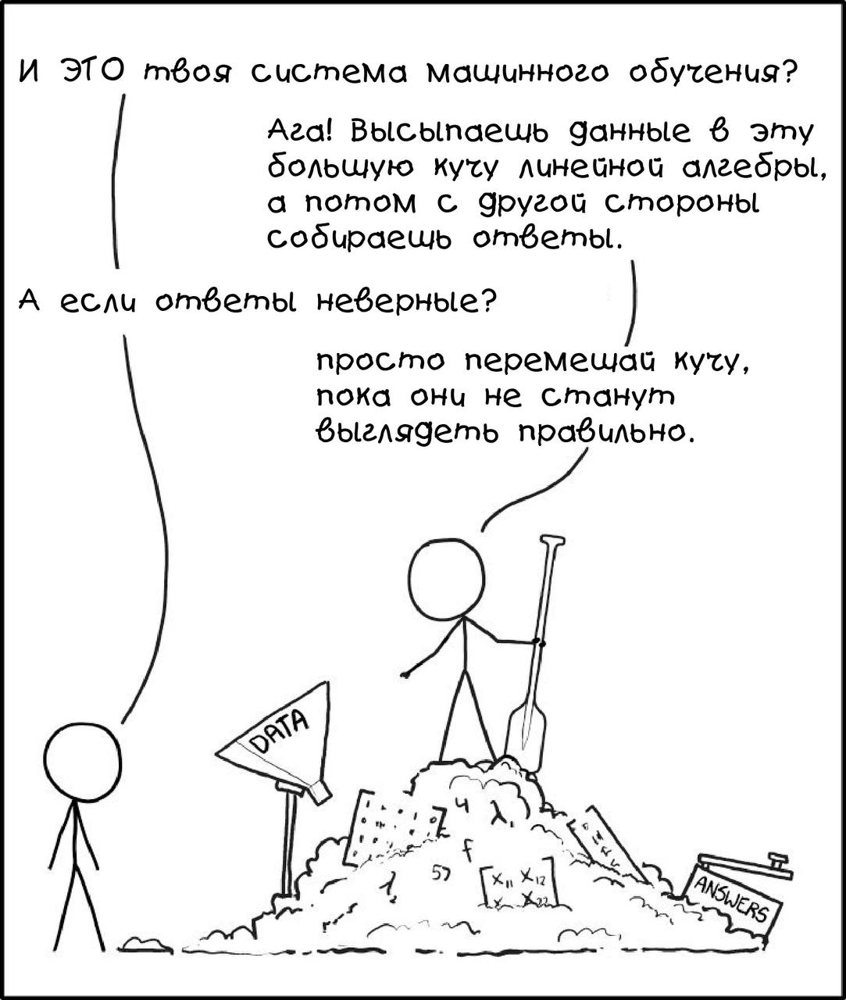